<a href="https://colab.research.google.com/github/wellia/DeepLearning/blob/main/convNet_pretrained.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#### How these experiments were performed
- Ran the experiments on Google Colaborators
- Ran training on the GPU (for most experiments) and TPU (for large images and EfficientNet)
- Saved models as h5 files and histories as pickle files
- Saved training history in experiment_result.csv. The file contains columns such as model, training accuracy, training loss, validation accuracy, validation loss, test accuracy, test loss, number of parameters, training time etc. This file is used for comparison analysis
- Ran the training until maximum epochs or validation loss was no longer improved (EarlyStoping callback)
- I had to use different Google accounts due to GPU usage limits. For that reason, I only used Tensorboard profiler to check the bottleneck of the training process and to check whether the GPU was optimally utilised.
- Some codes show no outputs because sometimes I ran the same code for different experiments, but I saved the models for each successful run.
- Default number of epochs = 100 unless changed for specific tasks
- Default batch size = 128 unless changed for specific tasks
- Default optimizer is Adam with InverseTimeDecay learning schedule unless changed for specific tasks


#### Setup

In [ ]:
# Set working directory
import os

from google.colab import drive
drive.mount('/content/drive')
assignment_dir = "/content/drive/MyDrive/Colab Notebooks/DeepLearning/Assignment2"
os.chdir(assignment_dir)

!pwd

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/Colab Notebooks/DeepLearning/Assignment2


#### Import libraries

In [ ]:
# Import libraries

%%capture

!pip install -U tensorboard
!pip install -U tensorboard_plugin_profile
!pip install -U tensorflow-addons

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import pickle, time

from tensorflow.keras import regularizers
from tensorflow.keras.utils import plot_model
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.resnet_v2 import ResNet50V2
from tensorflow.keras.applications.efficientnet import EfficientNetB0
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import models, layers
from tensorflow.keras.datasets import mnist, cifar10
from tensorflow.data.experimental import AUTOTUNE

from keras.utils.layer_utils import count_params
from sklearn.model_selection import train_test_split
from datetime import datetime
import tensorflow_addons as tfa

plt.rcParams['figure.figsize'] = (16, 10)
plt.rc('font', size=15)

#### Setup TPU


In [ ]:
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection
    print("Running on TPU ", tpu.cluster_spec().as_dict()["worker"])
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.TPUStrategy(tpu)
except ValueError:
    print("Not connected to a TPU runtime. Using CPU/GPU strategy")
    strategy = tf.distribute.MirroredStrategy()

INFO:tensorflow:Clearing out eager caches
INFO:tensorflow:Initializing the TPU system: grpc://10.48.204.42:8470


Running on TPU  ['10.48.204.42:8470']


INFO:tensorflow:Finished initializing TPU system.
INFO:tensorflow:Found TPU system:
INFO:tensorflow:*** Num TPU Cores: 8
INFO:tensorflow:*** Num TPU Workers: 1
INFO:tensorflow:*** Num TPU Cores Per Worker: 8
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:CPU:0, CPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:0, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:1, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:2, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:3, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:4, TPU, 0, 0)
INFO:tensorflow:***

In [ ]:
tf.config.experimental_connect_to_host('grpc://' + os.environ['COLAB_TPU_ADDR'])
resolver = tf.distribute.cluster_resolver.TPUClusterResolver('grpc://' + os.environ['COLAB_TPU_ADDR'])
tf.tpu.experimental.initialize_tpu_system(resolver)
strategy = tf.distribute.experimental.TPUStrategy(resolver) 

INFO:tensorflow:Clearing out eager caches
INFO:tensorflow:Initializing the TPU system: grpc://10.48.204.42:8470
INFO:tensorflow:Finished initializing TPU system.
INFO:tensorflow:Found TPU system:
INFO:tensorflow:*** Num TPU Cores: 8
INFO:tensorflow:*** Num TPU Workers: 1
INFO:tensorflow:*** Num TPU Cores Per Worker: 8
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:CPU:0, CPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:0, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:1, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:2, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:3, TPU, 0, 0)
INFO:tensorflow:*

#### Setup tensorboard

In [ ]:
# Set tensorboard logs
#!rm -rf ./logs/ # clear old logs if it's necessary
root_logdir = "/content/drive/MyDrive/logs"
run_id = datetime.now().strftime("%Y%m%d-%H%M%S")
logdir = os.path.join(root_logdir, run_id)

#### Constants and Functions

In [ ]:
# Declare constants and user defined functions

BATCH_SIZE = 128
VALIDATION_STEPS = 0
BUFFER_SIZE = 10000
NUM_EPOCHS = 100
LR_START = 0.001
LR_SCHEDULE = 0 # value will be set in set_lr_schedule()
model_dir = 'models/'

AUTOTUNE = tf.data.experimental.AUTOTUNE

histories = {}

os.environ['TF_GPU_THREAD_MODE'] = 'gpu_private'

rLRP= tf.keras.callbacks.ReduceLROnPlateau(
       monitor='val_loss', #Metric to be measured
       factor=.01, #Factor by which learning rate will be reduced
       patience=3,  #No. of epochs after which if there is no improvement in the val_acc, the learning rate is reduced
       min_lr=1e-5) #The minimum learning rate 

# Function to create a callback function to set early stopping and tensorBoard
def get_callbacks(name, isLog=True):
  return [
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=15),
    tf.keras.callbacks.TensorBoard(logdir + "/" + name, histogram_freq=1, write_images=True, profile_batch = '100,120') # the model’s performance batch 100 to 120  will be captured.
  ]

def get_callbacks_reduce(name, isLog=True):
  return [
    rLRP,
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=15),
    tf.keras.callbacks.TensorBoard(logdir + "/" + name, histogram_freq=1, write_images=True, profile_batch = '100,120') # the model’s performance batch 100 to 120  will be captured.
  ]

# Rescaling
def rescaling (image, is_reshape=False):
  x = tf.cast(image, tf.float32) / 255
  print(x.shape)
  if bool(is_reshape):
    x = np.expand_dims(x, axis=-1) # <--- add batch axis
    print(x.shape)
  return x

def convert (y):
  return to_categorical(y)

# Load data
def load_data(is_reshape=False):
  global STEPS_PER_EPOCH, VALIDATION_STEPS
  (X_train, y_train), (X_test, y_test) = mnist.load_data()

  # Set aside validation data
  X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42)

  STEPS_PER_EPOCH = len(X_train)/BATCH_SIZE
  VALIDATION_STEPS = len(X_val)/BATCH_SIZE

  X_train = rescaling(X_train, is_reshape)
  X_test = rescaling(X_test, is_reshape)
  X_val = rescaling(X_val, is_reshape)

  y_train = convert(y_train)
  y_test = convert(y_test)
  y_val = convert(y_val)

  return X_train, y_train, X_test, y_test, X_val, y_val

def load_cifar_data(batch_size):
    global STEPS_PER_EPOCH, VALIDATION_STEPS

    (X_train, y_train), (X_test, y_test) = cifar10.load_data()

    STEPS_PER_EPOCH = len(X_train)/BATCH_SIZE
    VALIDATION_STEPS = len(X_test)/BATCH_SIZE

    # Converting the pixels data to float type
    X_train = X_train.astype('float32')
    X_test = X_test.astype('float32')
    
    X_train = X_train / 255
    X_test = X_test / 255 

    # One hot encoding the target class (labels)
    num_classes = 10
    y_train = to_categorical(y_train, num_classes)
    y_test = to_categorical(y_test, num_classes)

    return X_train, y_train, X_test, y_test

# set learning schedule
def set_lr_schedule():   
    global LR_SCHEDULE
    LR_SCHEDULE = tf.keras.optimizers.schedules.InverseTimeDecay(
        LR_START,
        decay_steps=STEPS_PER_EPOCH*1000,
        decay_rate=1,
        staircase=False)

def set_lr_schedule_ExpDecay():   
    global LR_SCHEDULE
    LR_SCHEDULE = tf.keras.optimizers.schedules.ExponentialDecay(
        LR_START,
        decay_steps=STEPS_PER_EPOCH*1000,
        decay_rate=0.9)
    
# set input pipelines
def input_pipelines(xTrain, yTrain, xVal, yVal, xTest, yTest, batchSize = BATCH_SIZE):

  # Train dataset
  train_ds = tf.data.Dataset.from_tensor_slices((xTrain, yTrain))\
          .cache()\
          .shuffle(buffer_size=BUFFER_SIZE)\
          .batch(batch_size=batchSize)\
          .prefetch(AUTOTUNE)
        
  # Validation dataset
  val_ds = tf.data.Dataset.from_tensor_slices((xVal, yVal))\
          .batch(batch_size=batchSize)\
          .cache()\
          .prefetch(AUTOTUNE)

  # Test dataset
  test_ds = tf.data.Dataset.from_tensor_slices((xTest, yTest))\
          .batch(batch_size=batchSize)\

  return train_ds, val_ds, test_ds

# Plot accuracy and loss from train and validation
def plot_history(experiment_name):
  model_history = histories[experiment_name]
  fig = plt.figure(figsize=(15, 7))

  fig.suptitle('Training vs Validation of ' + experiment_name)
  ax1 = plt.subplot(1, 2, 1)
  ax1.plot(model_history['accuracy'])
  ax1.plot(model_history['val_accuracy'])
  ax1.set_xlabel('Epochs')
  ax1.set_ylabel('Accuracy')
  ax1.legend(['train', 'val'], loc='upper left')
  ax1.set_title('Accuracy')

  ax2 = plt.subplot(1, 2, 2)
  ax2.plot(model_history['loss'])
  ax2.plot(model_history['val_loss'])
  ax2.set_xlabel('Epochs')
  ax2.set_ylabel('Loss')
  ax2.legend(['train', 'val'], loc='upper left')
  ax2.set_title('Loss')

  plt.show()

# show image with label
def show_image(image, label):
  plt.figure(figsize=(2, 2))
  img_size = image.numpy().shape[0]
  plt.imshow(image.numpy().reshape(img_size,img_size))
  plt.title(label)
  plt.axis('off')

# check image shape to make sure it is suitable for the model
def check_image_shape(data_batches):
  for images, labels in data_batches.take(1):
    print(images.shape)
    print(images[0].shape)

# save model history
def save_model_history(history, file_name):
  with open(file_name, 'wb') as file_out_handle:
    pickle.dump(history, file_out_handle)

# load model history
def load_model_history(file_name):
  print(file_name)
  with open(file_name, 'rb') as file_in_handle:
      return pickle.load(file_in_handle)

def load_model(exp_name):
  global experiment_name
  experiment_name = exp_name
  file_name = model_dir + experiment_name
  histories[experiment_name] = load_model_history(file_name + '.pickle')  
  return models.load_model(file_name + '.h5')

col_list = ['model', 'total_params', 'trainable_params', 'accuracy','val_accuracy','loss','val_loss','data','time','epoch','description', 'test_acc', 'test_loss']

file_name = 'experiment_result.csv'

def save_csv():
  df.to_csv(file_name, index=False)

def load_csv():
  if os.path.isfile(file_name):
    df = pd.read_csv(file_name)
  else:
    print('No file found')
    df = pd.DataFrame(columns=col_list)
  return df
  
def save_experiment_result(df, model, experiment_name, data, description, train_time=0):  
  if df.empty:
    print('Load csv')
    load_csv()

  # get values
  trainable_params = count_params(model.trainable_weights)
  non_trainable_params = count_params(model.non_trainable_weights)
  total_params = trainable_params + non_trainable_params

  history = histories[experiment_name]
  length = len(df)

  epoch=len(history['accuracy'])
  train_time = round(train_time, 2)

  if length > 0:
    index = df.index[df['model'] == experiment_name]
    if len(index > 0):
      idx = index[0]
    else:
      idx = length
  else:
    idx = 0
    
  new_row =[experiment_name, total_params, trainable_params, history['accuracy'][-1], history['val_accuracy'][-1], 
            history['loss'][-1], history['val_loss'][-1], 
            data, train_time, epoch, description]
  print('Update at index ', idx)
  print(new_row)
  df.loc[idx] = new_row

  save_csv()
  
def get_ImageDataGenerator():
     return ImageDataGenerator(
        featurewise_center=True,
        samplewise_center=True,
        featurewise_std_normalization=True,
        samplewise_std_normalization=True,
        zca_whitening=True,
        rotation_range=20,
        width_shift_range=0.1,
        height_shift_range=0.1,
        horizontal_flip=True,
        vertical_flip=True)

def augment_test_data(image, label):
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, (IMAGE_SIZE, IMAGE_SIZE))
  image = tf.image.random_flip_left_right(image)
  image = tf.image.random_crop(image, size=[IMAGE_SIZE, IMAGE_SIZE, 3])
  return image, label

def augment_image(image, label):
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, (IMAGE_SIZE, IMAGE_SIZE))
  image = tf.image.random_flip_left_right(image)
  image = tf.image.random_crop(image, size=[IMAGE_SIZE, IMAGE_SIZE, 3])
  image = tf.image.random_flip_up_down(image)
  image = tf.image.rot90(image)
  return image, label
  
def pre_process_image(image, label):
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, (IMAGE_SIZE, IMAGE_SIZE))
  return image, label

pd.set_option('display.max_columns', 500, 'display.width', 1000)

df = load_csv()


In [ ]:
print(tf.__version__)

2.6.0


## Task 1 Solving MNIST with Convolutional Neural Networks


###Task 1.1 Revisit MNIST classification with DNN

The model from assignment 1 achieved 98.15% test accuracy and 0.1146 test loss. In this assignment, I added data augmentation to the model, it improved the test accuracy to 98.98% and reduced the test loss to 0.0423. However, the training time jumped significatnly from 1.12 minutes to 18.52 minutes.


#### Reproduce assignment 1 - MLP

In [ ]:
# load data for MLP
BATCH_SIZE = 128

X_train, y_train, X_test, y_test, X_val, y_val = load_data() 
set_lr_schedule()

# Construct input pipelines
train_ds, val_ds, test_ds = input_pipelines(X_train, y_train, X_val, y_val, X_test, y_test, BATCH_SIZE)

In [ ]:
# Model from Assignment 1
def make_dense_model():
  return models.Sequential([
    layers.Flatten(input_shape=(28, 28)),
    layers.BatchNormalization(),
    layers.Dense(512, activation='relu', kernel_initializer='he_uniform'),
    layers.Dropout(0.6),
    layers.Dense(10, activation='softmax')
])

In [ ]:
model_dense = make_dense_model()
model_dense.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 784)               0         
_________________________________________________________________
batch_normalization (BatchNo (None, 784)               3136      
_________________________________________________________________
dense (Dense)                (None, 512)               401920    
_________________________________________________________________
dropout (Dropout)            (None, 512)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 10)                5130      
Total params: 410,186
Trainable params: 408,618
Non-trainable params: 1,568
_________________________________________________________________


In [ ]:
# load models and history
experiment_name = 'model_dense'

model_dense = models.load_model(experiment_name + '.h5')
histories[experiment_name] = load_model_history(experiment_name + '.pickle')

model_dense.pickle


79/79 [==============================] - 0s 4ms/step - loss: 0.1146 - accuracy: 0.9815


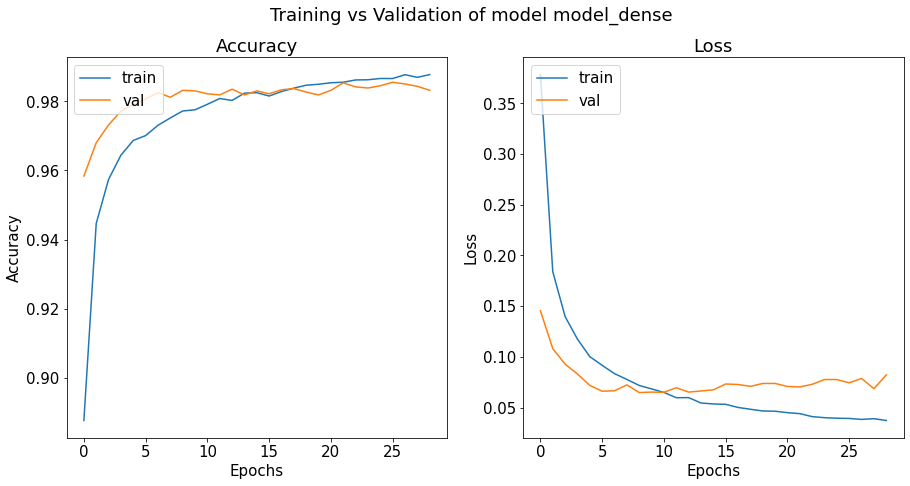

In [ ]:
model_dense.evaluate(test_ds)
plot_history(experiment_name)

In [ ]:
save_experiment_result(df, model_dense, 'model_dense', 'mnist', 'Best model from Assignment1', train_time)

#### Improving model with data augmentation

In [ ]:
# best model from asignment 1

model_dense = make_dense_model()
model_dense.summary()

model_dense.compile(optimizer=tf.keras.optimizers.Adam(LR_SCHEDULE), loss='categorical_crossentropy', metrics=['accuracy'])

experiment_name = 'model_dense'

print('batch_size: {0} #Epochs: {1}'.format(BATCH_SIZE, NUM_EPOCHS))

tf.keras.backend.clear_session()
start_time = time.time()
model_history = model_dense.fit(train_ds, batch_size=BATCH_SIZE, epochs=NUM_EPOCHS, validation_data=val_ds, callbacks=get_callbacks(experiment_name), verbose=2)
histories[experiment_name] = model_history.history
train_time = (time.time() - start_time)/60
print('Training time (in minutes): ', train_time)

model_dense.save(experiment_name + '.h5')
save_model_history(histories[experiment_name], experiment_name + '.pickle')

In [ ]:
X_train, y_train, X_test, y_test, X_val, y_val = load_data(is_reshape=True) 
set_lr_schedule()

model_dense_aug = make_dense_model()

model_dense_aug.compile(optimizer=tf.keras.optimizers.Adam(LR_SCHEDULE), loss='categorical_crossentropy', metrics=['accuracy'])

experiment_name = 'model_dense_aug'

print('batch_size: {0} #Epochs: {1}'.format(BATCH_SIZE, NUM_EPOCHS))

tf.keras.backend.clear_session()

datagen = ImageDataGenerator(
            featurewise_center=False,
            samplewise_center=False,
            featurewise_std_normalization=False,
            samplewise_std_normalization=False,
            zca_whitening=False,
            rotation_range=0,
            width_shift_range=0.1,
            height_shift_range=0.1)

experiment_name = 'model_dense_aug'

tf.keras.backend.clear_session()

datagen.fit(X_train)

start_time = time.time()
# fit the model on the batches generated by datagen.flow().
model_history = model_dense_aug.fit(x=datagen.flow(X_train, y_train, batch_size=BATCH_SIZE),
          verbose=2,
          epochs=NUM_EPOCHS,
          validation_data=(X_test, y_test),
          steps_per_epoch=STEPS_PER_EPOCH,
          callbacks=get_callbacks(experiment_name)
)
train_time = (time.time() - start_time)/60
print('Training time (in minutes): ', train_time)

histories[experiment_name] = model_history.history
model_dense_aug.save(experiment_name + '.h5')
save_model_history(histories[experiment_name], experiment_name + '.pickle')  

(54000, 28, 28)
(54000, 28, 28, 1)
(10000, 28, 28)
(10000, 28, 28, 1)
(6000, 28, 28)
(6000, 28, 28, 1)
batch_size: 128 #Epochs: 100
Epoch 1/100
421/421 - 20s - loss: 0.7776 - accuracy: 0.7659 - val_loss: 0.1993 - val_accuracy: 0.9487
Epoch 2/100
421/421 - 16s - loss: 0.3905 - accuracy: 0.8805 - val_loss: 0.1304 - val_accuracy: 0.9630
Epoch 3/100
421/421 - 15s - loss: 0.3157 - accuracy: 0.9046 - val_loss: 0.1063 - val_accuracy: 0.9675
Epoch 4/100
421/421 - 16s - loss: 0.2770 - accuracy: 0.9159 - val_loss: 0.0913 - val_accuracy: 0.9714
Epoch 5/100
421/421 - 16s - loss: 0.2614 - accuracy: 0.9227 - val_loss: 0.0844 - val_accuracy: 0.9748
Epoch 6/100
421/421 - 16s - loss: 0.2453 - accuracy: 0.9263 - val_loss: 0.0768 - val_accuracy: 0.9760
Epoch 7/100
421/421 - 16s - loss: 0.2356 - accuracy: 0.9284 - val_loss: 0.0749 - val_accuracy: 0.9771
Epoch 8/100
421/421 - 16s - loss: 0.2282 - accuracy: 0.9316 - val_loss: 0.0701 - val_accuracy: 0.9780
Epoch 9/100
421/421 - 16s - loss: 0.2227 - accuracy:

In [ ]:
# load models and history
experiment_name = 'model_dense_aug'

model_dense_aug = models.load_model(experiment_name + '.h5')
histories[experiment_name] = load_model_history(experiment_name + '.pickle')

model_dense_aug.pickle


79/79 [==============================] - 0s 4ms/step - loss: 0.0423 - accuracy: 0.9868


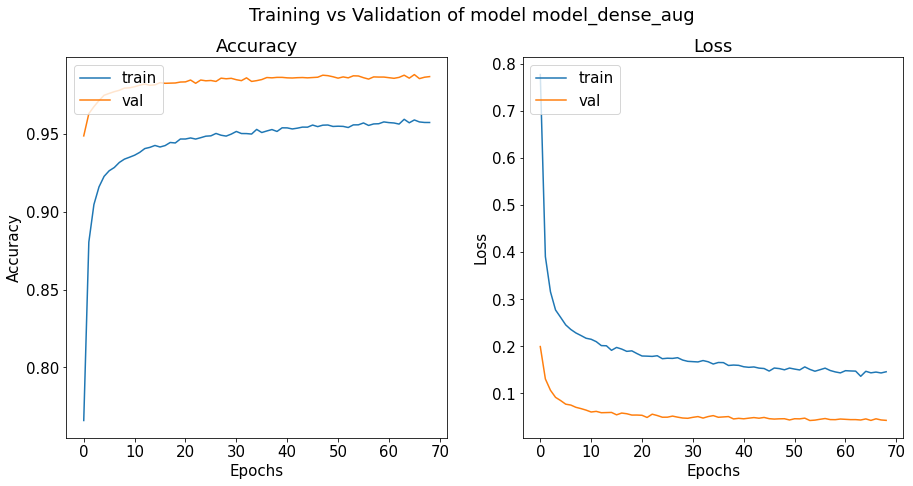

In [ ]:
model_dense_aug.evaluate(test_ds)
plot_history(experiment_name)

In [ ]:
save_experiment_result(df, model_dense_aug, experiment_name, 'Augmented images in feed forward model')

###Task 1.2 Train a ConvNet from scratch

I built a simple ConvNet with a stack of Conv2D with relu, MaxPooling2D, Conv2D with relu, Flatten, Dense with relu and Dense output layer with softmax.

The previous MLP model achieved  98% test accuracy and 0.1146 test loss. This ConvNet model achieved 99.08% test accuracy and 0.0477 test loss with only 1 minute more training time than the previous model.


##### ConvNet

In [ ]:
# load data for CNN
X_train, y_train, X_test, y_test, X_val, y_val = load_data(is_reshape=True) 
set_lr_schedule()
train_ds, val_ds, test_ds = input_pipelines(X_train, y_train, X_val, y_val, X_test, y_test, BATCH_SIZE)

11501568/11490434 [==============================] - 0s 0us/step
(54000, 28, 28)
(54000, 28, 28, 1)
(10000, 28, 28)
(10000, 28, 28, 1)
(6000, 28, 28)
(6000, 28, 28, 1)


In [ ]:
def make_model_cnn():
  model = tf.keras.models.Sequential([  
    tf.keras.layers.Conv2D(28, (3,3), activation='relu', input_shape=(28, 28, 1)),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(56, (3,3), activation='relu'),  
    tf.keras.layers.Flatten(),  
    tf.keras.layers.Dense(64, activation='relu'),  
    tf.keras.layers.Dense(10, activation='softmax')
  ])  

  model.compile(optimizer=tf.keras.optimizers.Adam(LR_SCHEDULE), loss='categorical_crossentropy', metrics=['accuracy'])

  return model

##### Basic ConvNet model

In [ ]:
model_cnn_basic = make_model_cnn() 

experiment_name = 'model_cnn_basic'

print('batch_size: {0} #Epochs: {1}'.format(BATCH_SIZE, NUM_EPOCHS))

tf.keras.backend.clear_session()
start_time=time.time()
model_history = model_cnn_basic.fit(train_ds, 
                                epochs = NUM_EPOCHS,
                                validation_data = val_ds,
                                callbacks=get_callbacks(experiment_name),
                                verbose=1)
train_time = (time.time() - start_time)/60
print('Training time (in minutes): ', train_time)

histories[experiment_name] = model_history.history

model_cnn_basic.save(experiment_name + '.h5')
save_model_history(histories[experiment_name], experiment_name + '.pickle')

batch_size: 128 #Epochs: 100
Epoch 1/100
422/422 [==============================] - 36s 11ms/step - loss: 0.1889 - accuracy: 0.9440 - val_loss: 0.0663 - val_accuracy: 0.9820
Epoch 2/100
422/422 [==============================] - 4s 9ms/step - loss: 0.0523 - accuracy: 0.9842 - val_loss: 0.0461 - val_accuracy: 0.9863
Epoch 3/100
422/422 [==============================] - 4s 8ms/step - loss: 0.0354 - accuracy: 0.9886 - val_loss: 0.0425 - val_accuracy: 0.9882
Epoch 4/100
422/422 [==============================] - 3s 8ms/step - loss: 0.0263 - accuracy: 0.9917 - val_loss: 0.0394 - val_accuracy: 0.9888
Epoch 5/100
422/422 [==============================] - 4s 8ms/step - loss: 0.0183 - accuracy: 0.9943 - val_loss: 0.0376 - val_accuracy: 0.9902
Epoch 6/100
422/422 [==============================] - 3s 8ms/step - loss: 0.0152 - accuracy: 0.9953 - val_loss: 0.0420 - val_accuracy: 0.9868
Epoch 7/100
422/422 [==============================] - 4s 8ms/step - loss: 0.0114 - accuracy: 0.9965 - val_loss

In [ ]:
# load model and history
experiment_name = 'model_cnn_basic'
model_cnn_basic = models.load_model(experiment_name + '.h5')
histories[experiment_name] = load_model_history(experiment_name + '.pickle')

model_cnn_basic.pickle


79/79 [==============================] - 1s 6ms/step - loss: 0.0477 - accuracy: 0.9900


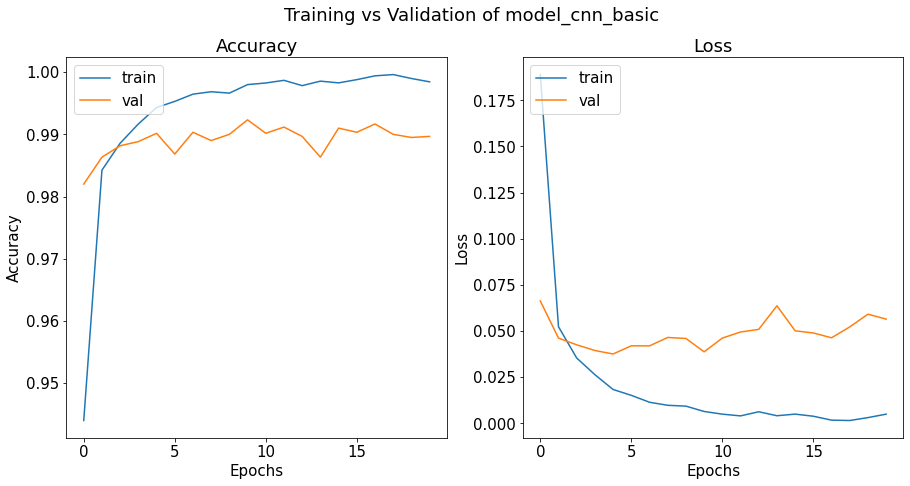

In [ ]:
# testing accuracy
model_cnn_basic.evaluate(test_ds)

# Plot history
plot_history(experiment_name)

In [ ]:
save_experiment_result(df, model_cnn_basic, experiment_name, 'Basic Convnet MINST', train_time)


### Task 1.3 Build an input pipeline for data augmentation


**Background**

Data augmentation often means generating randomly transformed images from the existing training set in order to increase model accuracy and generalization. 

**Experiments**

In this assignment, I experimented with popular augmentation techniques such as Keras ImageDataGenerator, tf.image functions, Keras preprocessing layers.

I resized and augmented the training data. I resized the evaluation data to fit into the pipelines for evaluation. 

I conducted the first experiment with a simple ConvNet on MNIST data using tf.images augmentation. *See Task 1.3 code below.*

I faced the problem of high input-bound (see the attachment file), but overcame it by reducing the batch size from 128 to 64 in the data pipeline.

Analysis of Experiment 1:

>In terms of accuracy, loss and speed, the augmention did not impact much the accuracy. The reason behind this is because MNIST is a simple dataset. Secondly, you cannot apply flipping and rotating on MNIST because the result of flipping or rotation of number 9 and 6 can be confusing for the machine or even people.

I also experimented with augmentation with Cifar-10 data. See *Task 2.1.2 Training a Shallow ConvNet codes*. I applied two augmentation methods (random flipping and rotate) to those techniques.

Analysis of Experiment 2:

>ImageDataGenerator
- Advantage: Easy to implement.
- Disadvantage: It is slower. In my experiments it took 5 times longer than tf.images and keras preprocessing. It caused high input-bound where the GPU is waiting for input processing by the CPU.

>tf.image functions:
applying tf.image functions to manually create the data augmentation routine
- Advantage: You can customise your augmentation operations or use other libraries such as OpenCV, scikit-image, PIL/Pillow, etc. In my experiments, it gave me the best accuracy.
You can perform cache and prefetch to utilise the GPU more efficiently
- Disadvantage: You need to know the exact functions that you need.

>Layers Data Augmentation:
applying the Sequential class and the preprocessing modules
- Advantage: Incorporating data augmentation into a tf.data pipeline, utilising the GPU more efficiently
- Disadvantage: In my experiments, it produced the least accuracy

New techniques such as AutoAugment and DeepAugment may help people to find the best augmentation combination. However, I didn't have time and resources to run the AutoAugment. I tried DeepAugment but had difficulties adapting the code because It used an older version of tensorflow

Because of the above result, I implemented tf.image augmentation for my experiments.

Here is below i the result of 3 different techniques of augmentation on Cifar-10:

In [ ]:
df = load_csv()
df_aug = df[df['model'].isin(['model_cifar_aug1','model_cifar_aug2','model_cifar_aug3'])]
df_aug

,model,total_params,trainable_params,accuracy,val_accuracy,loss,val_loss,data,time,epoch,description
8,model_cifar_aug1,274218,273962,0.54560,0.5717,1.293500,1.222200,cifar,4.398168,50,Shallow cnn preprocessing_aug
9,model_cifar_aug2,274218,273962,0.74340,0.6973,0.711715,0.885594,cifar,4.500000,83,Shallow cifar tf.images_aug
10,model_cifar_aug3,274218,273962,0.63944,0.6469,1.031803,1.020010,cifar,26.880000,61,Shallow cifar ImgDataGen_aug


#####Pipeline codes for data augmentation on MNIST

In [ ]:
def augment_mnist(image,label):
  image = tf.image.convert_image_dtype(image, tf.float32) 
  image = tf.image.resize(image, (IMAGE_SIZE, IMAGE_SIZE))
  image = tf.image.random_crop(image, size=[IMAGE_SIZE, IMAGE_SIZE, 1]) # Random crop back to IMAGE_SIZExIMAGE_SIZE
  image = tf.image.random_brightness(image, 0.2)
  return image, label

IMAGE_SIZE = 28

# Load MINST data for convnet augmentation
X_train, y_train, X_test, y_test, X_val, y_val = load_data(is_reshape=True) 
set_lr_schedule()

# Create input pipelines
train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
val_ds = tf.data.Dataset.from_tensor_slices((X_val, y_val)).batch(64).cache().repeat().prefetch(AUTOTUNE)
test_ds = tf.data.Dataset.from_tensor_slices((X_test, y_test)).batch(64)
augmented_train_batches = (train_ds.map(augment_mnist, num_parallel_calls=AUTOTUNE).batch(64).cache().repeat().prefetch(AUTOTUNE))

model_cnn_aug = make_model_cnn()

model_cnn_aug.compile(optimizer=tf.keras.optimizers.Adam(LR_SCHEDULE), loss='categorical_crossentropy', metrics=['accuracy'])

experiment_name = 'model_cnn_aug'

print('batch_size: {0} #Epochs: {1} steps_per_epoch: {2} validation_steps: {3}'.format(BATCH_SIZE, NUM_EPOCHS, STEPS_PER_EPOCH, VALIDATION_STEPS))

tf.keras.backend.clear_session()

start_time = time.time()
model_history = model_cnn_aug.fit(
  augmented_train_batches,
  steps_per_epoch=STEPS_PER_EPOCH,
  epochs=NUM_EPOCHS,
  validation_data=val_ds,
  validation_steps=VALIDATION_STEPS,
  callbacks=get_callbacks(experiment_name),
  verbose=1
)
train_time = (time.time() - start_time)/60
print('Training time (in minutes):', train_time)

histories[experiment_name] = model_history.history

file_name = model_dir + experiment_name
model_cnn_aug.save(file_name + '.h5')
save_model_history(histories[experiment_name], file_name + '.pickle')

(54000, 28, 28)
(54000, 28, 28, 1)
(10000, 28, 28)
(10000, 28, 28, 1)
(6000, 28, 28)
(6000, 28, 28, 1)
batch_size: 128 #Epochs: 100 steps_per_epoch: 421.875 validation_steps: 46.875
Epoch 1/100
421/421 - 38s - loss: 0.2118 - accuracy: 0.9367 - val_loss: 0.0668 - val_accuracy: 0.9810
Epoch 2/100
421/421 - 3s - loss: 0.0587 - accuracy: 0.9821 - val_loss: 0.0512 - val_accuracy: 0.9853
Epoch 3/100
421/421 - 3s - loss: 0.0392 - accuracy: 0.9881 - val_loss: 0.0481 - val_accuracy: 0.9875
Epoch 4/100
421/421 - 3s - loss: 0.0284 - accuracy: 0.9919 - val_loss: 0.0436 - val_accuracy: 0.9892
Epoch 5/100
421/421 - 3s - loss: 0.0218 - accuracy: 0.9936 - val_loss: 0.0416 - val_accuracy: 0.9893
Epoch 6/100
421/421 - 3s - loss: 0.0174 - accuracy: 0.9948 - val_loss: 0.0471 - val_accuracy: 0.9885
Epoch 7/100
421/421 - 3s - loss: 0.0134 - accuracy: 0.9961 - val_loss: 0.0453 - val_accuracy: 0.9895
Epoch 8/100
421/421 - 3s - loss: 0.0113 - accuracy: 0.9963 - val_loss: 0.0501 - val_accuracy: 0.9877
Epoch 9/1

In [ ]:
# load model and history
experiment_name = 'model_cnn_aug'
file_name = model_dir + experiment_name
model_cnn_aug = models.load_model(file_name + '.h5')
histories[experiment_name] = load_model_history(file_name + '.pickle')

model_cnn_aug.pickle


**New classification accuracy**

79/79 [==============================] - 1s 6ms/step - loss: 0.0500 - accuracy: 0.9898


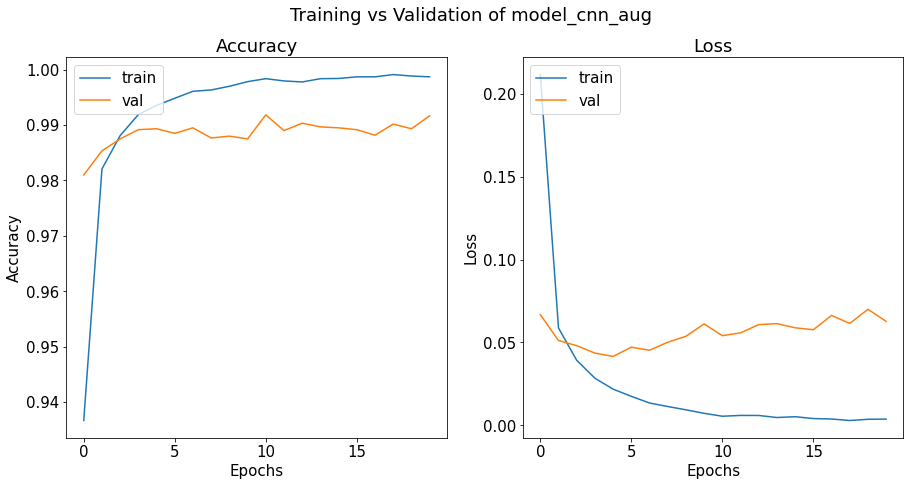

In [ ]:
model_cnn_aug.evaluate(test_ds)
plot_history(experiment_name)

In [ ]:
save_experiment_result(df, model_cnn_aug, experiment_name, 'mnist', 'Convnet MINST with augmentation', train_time)

#####Profiling - tensorboard

In [ ]:
# Show TensorBoard notebook extension
%reload_ext tensorboard

# Open an embedded TensorBoard viewer
%tensorboard --logdir {logdir}


<IPython.core.display.Javascript object>

### Task 1.4 MNIST with transfer learning

I experimented with a pretrained model VGG16 because it was easy to understand its architecture. 

The original purpose of VGG's research is to understand how the depth of convolutional networks affects the accuracy of large-scale image classification and recognition. The code under **VGG16 full layers** shows the structure of this model. 

Here are some notes on this architecture:
- It's 16 layers deep
- The input of VGG is set to an RGB image of 224x224 size
- To deepen the number of network layers without having too many parameters, a small 3x3 convolution kernel is used in all layers.
- The structure includes 5 blocks of convolutional layers, followed by a MaxPool
- The feature maps are increasing in each convolutional layers blocks starting from 64 in block 1 to 512 in block 5 

Here are notes from my experiments:
- The original paper uses a stochastic gradient descent SGD with momentum 0.9 and batch size 256. My experiment uses Adam with InverseTimeDecay learning schedule with a start learning rate of 0.001, because I wanted to keep the same optimiser as previous experiments with MNIST data
- Without fine-tuning, use a pretrained model as a feature extractor. I froze the convolution blocks of a pretrained model and modify the dense layers (include_tops set to false)
- For fine tuning, I froze 4 Convnet blocks, unfroze the last Convnet block, modify the dense layers(include_top = false) and retrain the model.
- Both without fine-tuning and with fine-tuning, I used the ImageNet weight
- If you want to include the top, your input size must be the same size as the original model, which is 224 x 224. 

Problems and solution:
- Initially, I used an image size of 150 x 150, but it caused a Running out of memory error while fitting the model. The solution was to reduce the image size from 150 to 32 because Keras allows a minimum input size of 32 x 32. 
- I also used keras clearsession to free memory of the previous model building
- The images with input size 32 x 32 returned poor results, I then increased the size to 64 x 64 and it gave good results.



#####Load data for VGG

In [ ]:
# VGG load MNIST data

X_train, y_train, X_test, y_test, X_val, y_val = load_data(is_reshape=True) 
set_lr_schedule()
train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
val_ds = tf.data.Dataset.from_tensor_slices((X_val, y_val))
test_ds = tf.data.Dataset.from_tensor_slices((X_test, y_test))

# pre-process images
IMAGE_SIZE = 64
def pre_process_image_vgg(image, label):
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, (IMAGE_SIZE, IMAGE_SIZE))
  image = tf.image.grayscale_to_rgb(image)
  return image, label

# input pipelines
train_batches = train_ds.map(pre_process_image_vgg).batch(BATCH_SIZE).cache().repeat().prefetch(AUTOTUNE)
val_batches = val_ds.map(pre_process_image_vgg).batch(BATCH_SIZE).cache().repeat().prefetch(AUTOTUNE)
test_batches = test_ds.map(pre_process_image_vgg).batch(BATCH_SIZE)

11501568/11490434 [==============================] - 0s 0us/step
(54000, 28, 28)
(54000, 28, 28, 1)
(10000, 28, 28)
(10000, 28, 28, 1)
(6000, 28, 28)
(6000, 28, 28, 1)


#####VGG16 full layers


In [ ]:
# code ref: VGG full layer

# when include_top, the image size must 224 x 224
conv_base_vgg_complete = VGG16(weights='imagenet',
                  include_top=True,
                  input_shape=(224, 224, 3))
conv_base_vgg_complete.summary()

553476096/553467096 [==============================] - 5s 0us/step
Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
____________________________________________________________

##### VGG16 - Not include top

In [ ]:
# VGG16 pretrained model on imagenet as a base model
IMAGE_SIZE = 64
conv_base_vgg = VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))

conv_base_vgg.summary()

58900480/58889256 [==============================] - 1s 0us/step
Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 64, 64, 3)]       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 64, 64, 64)        1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 64, 64, 64)        36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 32, 32, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 32, 32, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 32, 32, 128)       147584    
______________________________________________________________

In [ ]:
# Construct the model
def make_model_vgg():
  model = models.Sequential()
  model.add(conv_base_vgg)
  model.add(layers.Flatten())
  model.add(layers.Dense(256, activation='relu'))
  model.add(layers.Dropout(0.5))
  model.add(layers.Dense(10, activation='softmax'))

  model.compile(optimizer=tf.keras.optimizers.Adam(LR_SCHEDULE), loss='categorical_crossentropy', metrics=['accuracy'])

  model.summary()
  
  return model

##### VGG16 without fine tune

In [ ]:
# without fine tune, pretrained base model weight is frozen
conv_base_vgg.trainable = False

model_vgg_noTune = make_model_vgg()
model_vgg_noTune.summary()

experiment_name = 'model_vgg_noTune'

print('batch_size: {0} #Epochs: {1} steps_per_epoch: {2} validation_steps: {3}'.format(BATCH_SIZE, NUM_EPOCHS, STEPS_PER_EPOCH, VALIDATION_STEPS))

tf.keras.backend.clear_session()
start_time = time.time()
model_history = model_vgg_noTune.fit(
    train_batches, 
    steps_per_epoch=STEPS_PER_EPOCH, 
    epochs=NUM_EPOCHS,
    validation_data=val_batches,
    validation_steps=VALIDATION_STEPS,
    callbacks=get_callbacks(experiment_name),
    verbose=2
)
train_time = (time.time() - start_time)/60
print('Training time (in minutes): ', train_time)

histories[experiment_name] = model_history.history

# save model
model_vgg_noTune.save(experiment_name + '.h5')
save_model_history(histories[experiment_name], experiment_name + '.pickle')

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 2, 2, 512)         14714688  
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 256)               524544    
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 10)                2570      
Total params: 15,241,802
Trainable params: 527,114
Non-trainable params: 14,714,688
_________________________________________________________________
batch_size: 128 #Epochs: 200 steps_per_epoch: 421.875 validation_steps: 46.875
Epoch 1/200
421/421 - 78s

In [ ]:
# load model
experiment_name = 'model_vgg_noTune'
model_vgg_noTune = models.load_model(experiment_name + '.h5')
histories[experiment_name] = load_model_history(experiment_name + '.pickle')

model_vgg_noTune.pickle


79/79 [==============================] - 7s 89ms/step - loss: 0.0446 - accuracy: 0.9902


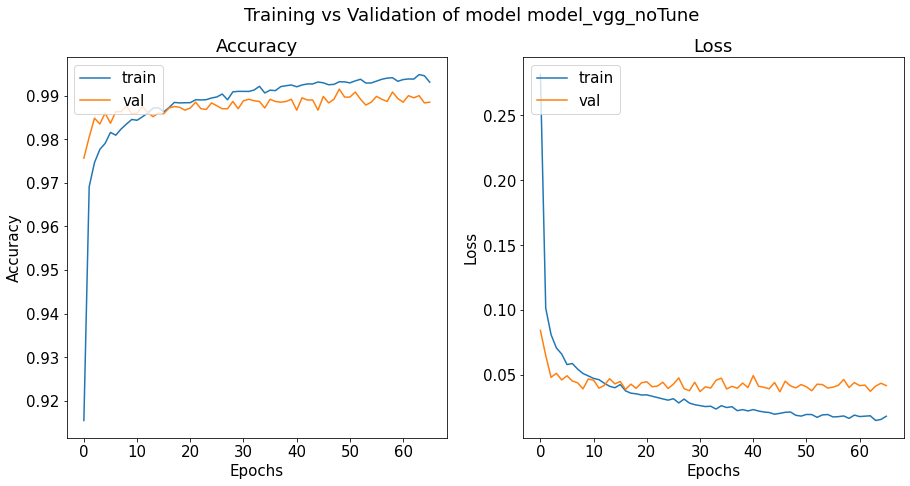

In [ ]:
# evaluate and plot
model_vgg_noTune.evaluate(test_batches)
plot_history(experiment_name)

In [ ]:
save_experiment_result(df, model_vgg_noTune, experiment_name, 'mnist', 'VGG16 MINST no tune', train_time)

##### VGG Fine tuning pre-trained

In [ ]:
conv_base_vgg.trainable = True

# Only unfreeze block5 Conv layers 
for layer in conv_base_vgg.layers:
  if "block5" in layer.name: 
    layer.trainable = True
  else:    
    layer.trainable = False
      
model_vgg_fineTune = make_model_vgg()

experiment_name = 'model_vgg_fineTune'

print('batch_size: {0} #Epochs: {1} steps_per_epoch: {2} validation_steps: {3}'.format(BATCH_SIZE, NUM_EPOCHS, STEPS_PER_EPOCH, VALIDATION_STEPS))

tf.keras.backend.clear_session()
start_time = time.time()
model_history = model_vgg_fineTune.fit(
    train_batches, 
    steps_per_epoch=STEPS_PER_EPOCH, 
    epochs=NUM_EPOCHS,
    validation_data=val_batches,
    validation_steps=VALIDATION_STEPS,
    callbacks=get_callbacks('model_vgg_fineTune'),
    verbose=2)
train_time = (time.time() - start_time)/60
print('Training time (in minutes): ', train_time)

histories[experiment_name] = model_history.history

file_name = model_dir + experiment_name
model_vgg_fineTune.save(file_name + '.h5')
save_model_history(histories[experiment_name], file_name + '.pickle')

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 2, 2, 512)         14714688  
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 256)               524544    
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 10)                2570      
Total params: 15,241,802
Trainable params: 7,606,538
Non-trainable params: 7,635,264
_________________________________________________________________
batch_size: 128 #Epochs: 200 steps_per_epoch: 421.875 validation_steps: 46.875
Epoch 1/200
421/421 - 52

In [ ]:
# Load model
experiment_name = 'model_vgg_fineTune'
file_name = model_dir + experiment_name
model_vgg_fineTune = models.load_model(file_name + '.h5')
histories[experiment_name] = load_model_history(file_name + '.pickle')

model_vgg_fineTune.pickle


79/79 [==============================] - 7s 91ms/step - loss: 0.0515 - accuracy: 0.9930


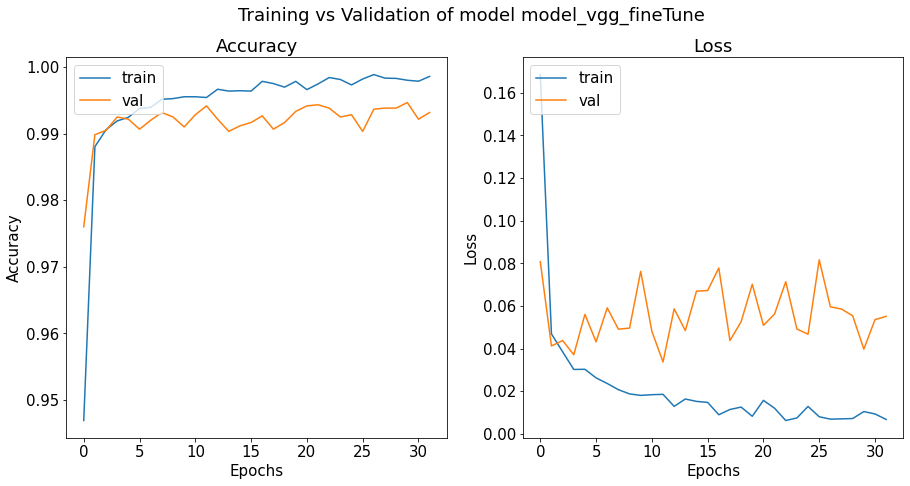

In [ ]:
model_vgg_fineTune.evaluate(test_batches)
plot_history(experiment_name)

In [ ]:
save_experiment_result(df, model_vgg_fineTune, experiment_name, 'mnist', 'VGG16 MINST fine tune', train_time)

### Task 1.5 Performance comparison



####VGG16 Without fine-tuning vs with fine-tuning


In [ ]:
df_vgg = df[df['model'].str.contains('model_vgg')]
df_vgg[['model','total_params','trainable_params', 'test_acc','test_loss', 'time', 'epoch', 'description']]

,model,total_params,trainable_params,test_acc,test_loss,time,epoch,description
4,model_vgg_noTune,15241802,527114,0.9902,0.0446,44.24,66,VGG16 MINST no tune
5,model_vgg_fineTune,15241802,7606538,0.9930,0.0515,25.56,32,VGG16 MINST fine tune



Without fine tuning, the number of trainable parameters is 527,114 and with fine tuning, the trainable parameters is 7,606,538. 

Both accuracy and loss are comparables for both settings. The fine-tuned model has slightly better performance. As expected, the trainable parameters are much more in fine-tuned model. From the plots, we see that without fine-tuned model converged at epoch 12 whereas with fine-tuned model converged at epoch 5. The without fine-tuned spent more training time, however this training time doubtly can be use as comparisons because inconsistency GPU service in Colab.

What I found from my experiments, pretrained models converged faster. In term of accuracy, I didn't see the benefits.  

A pre-trained model converge faster because it's weights are already optimized. In addition, we don’t need a large data to train, less training time and requires less effort in building the model's architecture.




#####Breakdown calculation for trainable parameters.




*   Parameters for VGG convolution layers: 14,714,688
*   Parameters for VGG FC layers: 123,642,856
*   Parameters for block5: 2,359,808 x 3 = 7,079,424
*   My FC layers: 527,114
*   VGG without tuning = my dense layers = **527,114**
*   VGG with tuning = total block5 parameters + my dense layers = 7,079,424 + 527,114 = **7,606,538**

#### All models on MNIST

Below is the comparisons all models on MNIST. As you can see, all techniques are resulting good results. Except model_dense has slightly higher test loss.

VGG16 has much more parameters than fully connected layers models and ConvNet models. 

Conclusion
* ConvNet and pre-trained models (99% test accuracy) performed better than a fully connected layer (98% test accuracy) 
* Augmented data gave mixed results. In dense models, the augmented model is better than the basic model. But in CNN, the basic model is better than the augmented CNN. 


In [ ]:
df_mnist = df[df['data']=='mnist']

df_mnist[['model', 'total_params', 'time', 'test_acc', 'test_loss', 'description']]

,model,total_params,time,test_acc,test_loss,description
0,model_dense,410186,1.120000,0.9815,0.1146,Best model from Assignment1
1,model_dense_aug,410186,18.521168,0.9898,0.0423,Augmented images in MLP model
2,model_cnn_basic,448826,2.061608,0.9900,0.0477,Basic Convnet MINST
3,model_cnn_aug,448826,1.599618,0.9898,0.0500,Convnet MINST with augmentation
4,model_vgg_noTune,15241802,44.240000,0.9902,0.0446,VGG16 MINST no tune
5,model_vgg_fineTune,15241802,25.560000,0.9930,0.0515,VGG16 MINST fine tune


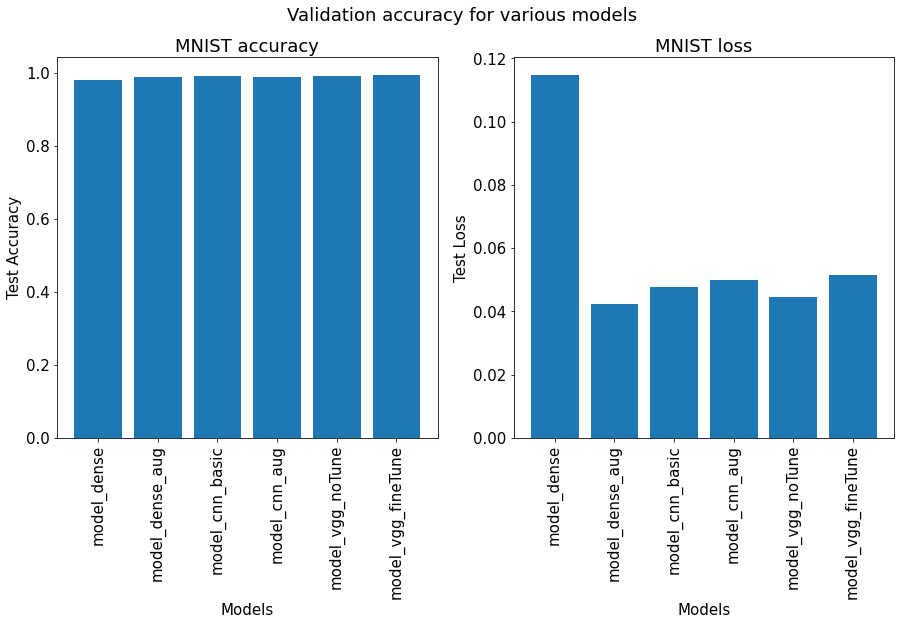

In [ ]:
fig = plt.figure(figsize=(15, 7))

fig.suptitle('Validation accuracy for various models')

ax1 = plt.subplot(1, 2, 1)
ax1.bar(df_mnist['model'],df_mnist['test_acc'])
ax1.set_xlabel('Models')
ax1.set_ylabel('Test Accuracy')
ax1.set_title('MNIST accuracy')
ax1.set_xticklabels(df_mnist['model'], rotation=90)

ax2 = plt.subplot(1, 2, 2)
ax2.bar(df_mnist['model'],df_mnist['test_loss'])
ax2.set_xlabel('Models')
ax2.set_ylabel('Test Loss')
ax2.set_title('MNIST loss')
ax2.set_xticklabels(df_mnist['model'], rotation=90)

plt.show()

## Task 2 Fast training of deep networks


### Task 2.1 Train a highly accurate network for CIFAR10


The CIFAR-10 dataset consists of 60,000 32x32 color images of 10 classes (airplane, automobile, bird, cat, deer, dog, frog, horse, ship, and truck). There are 50,000 images used for training and 10,000 imaged used for testing.

#### Task 2.1.1 Document the hardware used


I used Google colab for the experiment. Here are the hardware specifications 
- GPU model Tesla K80, Num GPU 1, Memory limit: 11345264640 bytes
- the CPU model, the number of CPUs, and the CPU clock speed
Num CPU: 2, Intel(R) Xeon(R) CPU @ 2.30GHz, and Intel(R) Xeon(R) CPU @ 2.30GHz
- Num TPU Cores: 8, Num TPU Workers: 1, Num TPU Cores Per Worker: 8

I run bash operation to log the GPU usage to a gpu.log file (a sample gpu log file was submitted together with this assignment). This log file was collected as part of the first resnet experiment, to check whether the batch size 128 is the optimum for the current hardware. It started as 0%, went up to the maximum of 98% GPU usage. Similarly, we can monitor the memory usage, it started as 10296 MiB down to 2984 MiB as the process continues.

power.draw [W], **utilization.gpu** [%], *memory.used* [MiB], memory.free [MiB], fan.speed [%], temperature.gpu

75.33 W, **0** %, *1145* MiB, 10296 MiB, [N/A], 73

|

|

|

135.28 W, **98** %, *8457* MiB, 2984 MiB, [N/A], 76

I concluded that batch size 128 with input image size 32 x 32 is appropritate.  
When I tried to run experiments with image size 224 x 224, the machine is crashed running out of memory. I increased the image size to 64 x 64 in a couple experiments. I used TPU to run big input image size.







#####Check hardware

In [ ]:
!/usr/local/cuda/bin/nvcc --version

!nvidia-smi

!cat /proc/cpuinfo



nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0
Sat Sep 25 00:42:48 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.63.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8    28W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |            

In [ ]:
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 11923953994739073506, name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 11345264640
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 7196468995350747955
 physical_device_desc: "device: 0, name: Tesla K80, pci bus id: 0000:00:04.0, compute capability: 3.7"]

In [ ]:
%%writefile gpu_usage.sh

#comment: run for 500 seconds
end=$((SECONDS+500))

while [ $SECONDS -lt $end ]; do
    nvidia-smi --format=csv --query-gpu=power.draw,utilization.gpu,memory.used,memory.free,fan.speed,temperature.gpu >> gpu.log
done

Writing gpu_usage.sh


In [ ]:
%%bash --bg

bash gpu_usage.sh

Starting job # 0 in a separate thread.


#### Task 2.1.2 Train a "shallow" **ConvNet**


I built  a ConvNet with 9 layers. Train the network until it converges and reach maximum epochs or terminated by EarlyStopping callback.

#####Cifar-10 data exploration and visualisation

In [ ]:
# Creating a list of all the class labels
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

In [ ]:
# load data
X_train, y_train, X_test, y_test  = load_cifar_data(batch_size=128)
set_lr_schedule()

170508288/170498071 [==============================] - 6s 0us/step


In [ ]:
def make_shallow_model_cnn():
  model = models.Sequential()

  model.add(layers.Conv2D(32, (3,3), padding='same', activation='relu', input_shape=(32,32,3)))
  model.add(layers.MaxPooling2D(pool_size=(2,2)))
  model.add(layers.Conv2D(32, (3,3), padding='same', activation='relu'))
  model.add(layers.MaxPooling2D(pool_size=(2,2)))
  model.add(layers.Dropout(0.3))

  model.add(layers.Flatten())
  model.add(layers.Dense(128, activation='relu'))
  model.add(layers.Dropout(0.5))
  model.add(layers.Dense(10, activation='softmax'))    # num_classes = 10

  return model

In [ ]:
# Checking the number of rows (records) and columns (features)
print('X_train:', X_train.shape)
print('y_train:', y_train.shape)
print('X_test:', X_test.shape)
print('y_test:', y_test.shape)

X_train: (50000, 32, 32, 3)
y_train: (50000, 10)
X_test: (10000, 32, 32, 3)
y_test: (10000, 10)


In [ ]:
print(y_train)
np.argmax(y_train[0])

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]


6

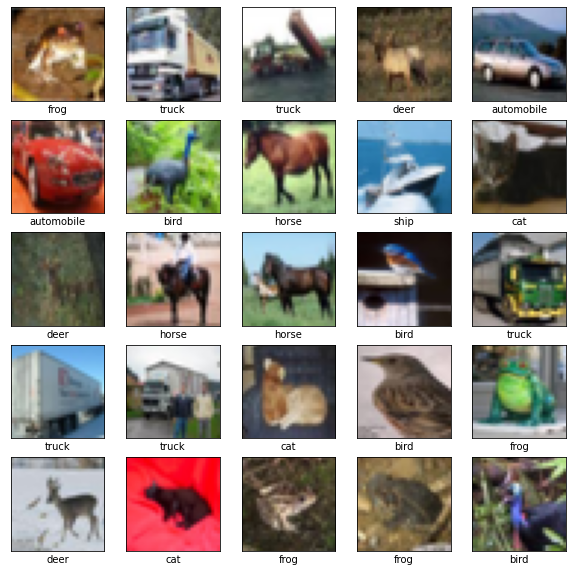

In [ ]:
# Visualizing some of the images from the training dataset
plt.figure(figsize=[10,10])
for i in range (25):    # for first 25 images
  plt.subplot(5, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(X_train[i], cmap=plt.cm.binary)
  plt.xlabel(class_names[np.argmax(y_train[i])])

plt.show()

#####Prepare testing data

In [ ]:
# Make test data for testing (not validation), use data augmention to make syntetic test data
X_dump, X_testing, y_dump, y_testing = train_test_split(X_test, y_test, test_size=0.01, random_state=42)
print('Number of test data:', len(y_testing))
testing_ds = tf.data.Dataset.from_tensor_slices((X_testing, y_testing))

IMAGE_SIZE = 32
testing_batches = testing_ds.map(augment_test_data).batch(100)

IMAGE_SIZE = 64
testing_batches64 = testing_ds.map(augment_test_data).batch(100)

IMAGE_SIZE = 224
testing_batches224 = testing_ds.map(augment_test_data).batch(100)

Number of test data: 100


##### Shallow ConvNet basic

In [ ]:
# input pipelines

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))\
        .batch(batch_size=BATCH_SIZE)\
        .cache()\
        .repeat()\
        .prefetch(AUTOTUNE)
      
test_ds = tf.data.Dataset.from_tensor_slices((X_test, y_test))\
        .batch(batch_size=BATCH_SIZE)\
        .cache()\
        .repeat()\
        .prefetch(AUTOTUNE)

In [ ]:
# make  model shallow cnn basic

model_cifar = make_shallow_model_cnn()

model_cifar.compile(optimizer=tf.keras.optimizers.Adam(LR_SCHEDULE), loss='categorical_crossentropy', metrics=['accuracy'])

model_cifar.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 32, 32, 32)        896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 16, 16, 32)        9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 8, 8, 32)          0         
_________________________________________________________________
dropout (Dropout)            (None, 8, 8, 32)          0         
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 128)               2

In [ ]:
print('batch_size: {0} #Epochs: {1} steps_per_epoch: {2} validation_steps: {3}'.format(BATCH_SIZE, NUM_EPOCHS, STEPS_PER_EPOCH, VALIDATION_STEPS))

experiment_name = 'model_cifar'

tf.keras.backend.clear_session()
start_time = time.time()

model_history = model_cifar.fit(
    train_ds, 
    steps_per_epoch=STEPS_PER_EPOCH, 
    epochs=NUM_EPOCHS,
    validation_data=test_ds,
    validation_steps=VALIDATION_STEPS,
    callbacks=get_callbacks(experiment_name),
    verbose=1)

train_time = (time.time() - start_time)/60
print('Training time (in minutes): ', train_time)

histories[experiment_name] = model_history.history

file_name = model_dir + experiment_name
model_cifar.save(file_name + '.h5')
save_model_history(histories[experiment_name], file_name + '.pickle')

batch_size: 128 #Epochs: 100 steps_per_epoch: 390.625 validation_steps: 78.125
Epoch 1/100
390/390 [==============================] - 37s 13ms/step - loss: 1.7162 - accuracy: 0.3786 - val_loss: 1.3548 - val_accuracy: 0.5219
Epoch 2/100
390/390 [==============================] - 4s 9ms/step - loss: 1.3978 - accuracy: 0.4982 - val_loss: 1.2131 - val_accuracy: 0.5795
Epoch 3/100
390/390 [==============================] - 4s 10ms/step - loss: 1.2694 - accuracy: 0.5471 - val_loss: 1.1145 - val_accuracy: 0.6121
Epoch 4/100
390/390 [==============================] - 4s 9ms/step - loss: 1.1959 - accuracy: 0.5761 - val_loss: 1.0576 - val_accuracy: 0.6295
Epoch 5/100
390/390 [==============================] - 4s 9ms/step - loss: 1.1363 - accuracy: 0.5941 - val_loss: 1.0071 - val_accuracy: 0.6482
Epoch 6/100
390/390 [==============================] - 4s 9ms/step - loss: 1.0913 - accuracy: 0.6142 - val_loss: 0.9912 - val_accuracy: 0.6504
Epoch 7/100
390/390 [==============================] - 4s 9m

In [ ]:
# load models and history
model_cifar = load_model('model_cifar')

models/model_cifar.pickle


In [ ]:
# Testing accuracy
model_cifar.evaluate(testing_batches)

1/1 [==============================] - 1s 594ms/step - loss: 0.6819 - accuracy: 0.7500


[0.6819274425506592, 0.75]

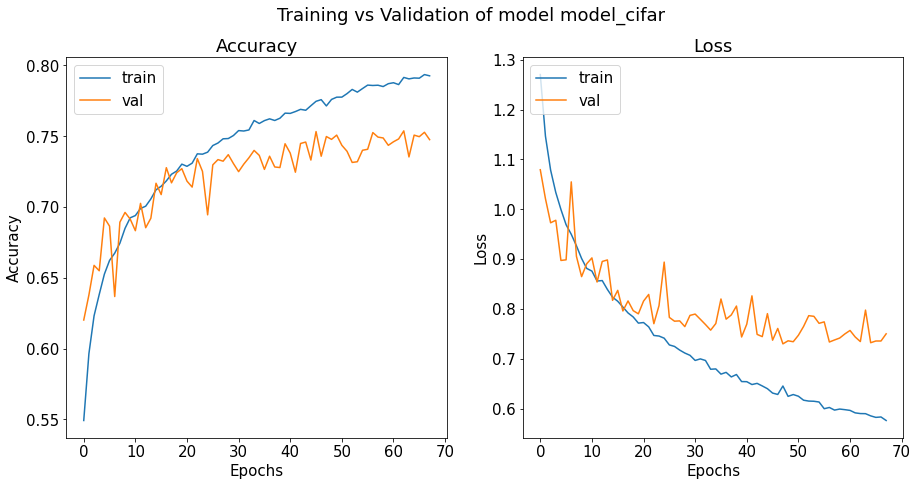

In [ ]:
plot_history(experiment_name)

In [ ]:
save_experiment_result(df, model_cifar, experiment_name, 'cifar', 'Shallow convnet cifar', train_time)

##### Shallow convnet with Keras Preprocessing layers augmentation

In [ ]:
# Data Augmentation using Keras Preprocessing Layers 

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
test_ds = tf.data.Dataset.from_tensor_slices((X_test, y_test))

train_batches = train_ds.batch(BATCH_SIZE).cache().shuffle(buffer_size=BUFFER_SIZE).repeat().prefetch(AUTOTUNE)
test_batches = test_ds.batch(BATCH_SIZE).cache().repeat().prefetch(AUTOTUNE)

IMAGE_SIZE = 32
resize_and_rescale = tf.keras.Sequential([
  layers.experimental.preprocessing.Resizing(IMAGE_SIZE, IMAGE_SIZE),
  layers.experimental.preprocessing.Rescaling(1./255)
])

image = X_train[0]
label = y_train[0]

plt.figure(figsize=(3,3))
plt.axis('off')
plt.imshow(image)
plt.xlabel(class_names[np.argmax(label)])

image = tf.expand_dims(image, 0)

data_augmentation = tf.keras.Sequential([
  layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
  layers.experimental.preprocessing.RandomRotation(0.2),
])

plt.figure(figsize=(10, 10))
for i in range(9):
  augmented_image = data_augmentation(image)
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(augmented_image[0])
  plt.axis("off")

In [ ]:
# Use the same architecture as shalllow convnet

model_cifar_aug1 = tf.keras.Sequential([
  layers.Input(shape=(32, 32, 3)),
  data_augmentation,
  layers.Conv2D(32, (3,3), padding='same', activation='relu'),
  layers.MaxPooling2D(pool_size=(2,2)),
  layers.Conv2D(32, (3,3), padding='same', activation='relu'),
  layers.MaxPooling2D(pool_size=(2,2)),
  layers.Dropout(0.3),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.BatchNormalization(),
  layers.Dropout(0.5),
  layers.Dense(10, activation='softmax')])

model_cifar_aug1.summary()

model_cifar_aug1.compile(optimizer=tf.keras.optimizers.Adam(LR_SCHEDULE), loss='categorical_crossentropy', metrics=['accuracy'])


Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_1 (Sequential)    (None, 32, 32, 3)         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 32, 32, 32)        896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 16, 16, 32)        9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 8, 8, 32)          0         
_________________________________________________________________
dropout (Dropout)            (None, 8, 8, 32)          0         
_________________________________________________________________
flatten (Flatten)            (None, 2048)             

In [ ]:
print('batch_size: {0} #Epochs: {1} steps_per_epoch: {2} validation_steps: {3}'.format(BATCH_SIZE, NUM_EPOCHS, STEPS_PER_EPOCH, VALIDATION_STEPS))

experiment_name = 'model_cifar_aug1'

tf.keras.backend.clear_session()
start_time = time.time()

model_history = model_cifar_aug1.fit(
    train_batches, 
    steps_per_epoch=STEPS_PER_EPOCH, 
    epochs=50,
    validation_data=test_batches,
    validation_steps=VALIDATION_STEPS,
    callbacks=get_callbacks(experiment_name),
    verbose=2)

train_time = (time.time() - start_time)/60
print('Training time (in minutes): ', train_time)

histories[experiment_name] = model_history.history

file_name = model_dir + experiment_name
model_cifar_aug1.save(file_name + '.h5')
save_model_history(histories[experiment_name], file_name + '.pickle')

batch_size: 128 #Epochs: 200 steps_per_epoch: 390.625 validation_steps: 78.125
Epoch 1/50
390/390 - 38s - loss: 1.9324 - accuracy: 0.2943 - val_loss: 1.8498 - val_accuracy: 0.4128
Epoch 2/50
390/390 - 4s - loss: 1.7162 - accuracy: 0.3736 - val_loss: 1.5574 - val_accuracy: 0.4354
Epoch 3/50
390/390 - 4s - loss: 1.6572 - accuracy: 0.3968 - val_loss: 1.5898 - val_accuracy: 0.4331
Epoch 4/50
390/390 - 4s - loss: 1.6225 - accuracy: 0.4153 - val_loss: 1.4861 - val_accuracy: 0.4700
Epoch 5/50
390/390 - 4s - loss: 1.5899 - accuracy: 0.4271 - val_loss: 1.5168 - val_accuracy: 0.4568
Epoch 6/50
390/390 - 4s - loss: 1.5689 - accuracy: 0.4362 - val_loss: 1.4780 - val_accuracy: 0.4800
Epoch 7/50
390/390 - 4s - loss: 1.5512 - accuracy: 0.4434 - val_loss: 1.4924 - val_accuracy: 0.4651
Epoch 8/50
390/390 - 4s - loss: 1.5268 - accuracy: 0.4504 - val_loss: 1.4550 - val_accuracy: 0.4848
Epoch 9/50
390/390 - 4s - loss: 1.5201 - accuracy: 0.4563 - val_loss: 1.3531 - val_accuracy: 0.5181
Epoch 10/50
390/390 

In [ ]:
save_experiment_result(df, model_cifar_aug1, experiment_name, 'cifar', 'Shallow cnn preprocessing_aug', train_time)

In [ ]:
# load models and history
model_cifar_aug1 = load_model('model_cifar_aug1')

models/model_cifar_aug1.pickle


In [ ]:
# testing accuracy
model_cifar_aug1.evaluate(testing_batches)

1/1 [==============================] - 0s 210ms/step - loss: 1.2070 - accuracy: 0.5600


[1.2069569826126099, 0.5600000023841858]

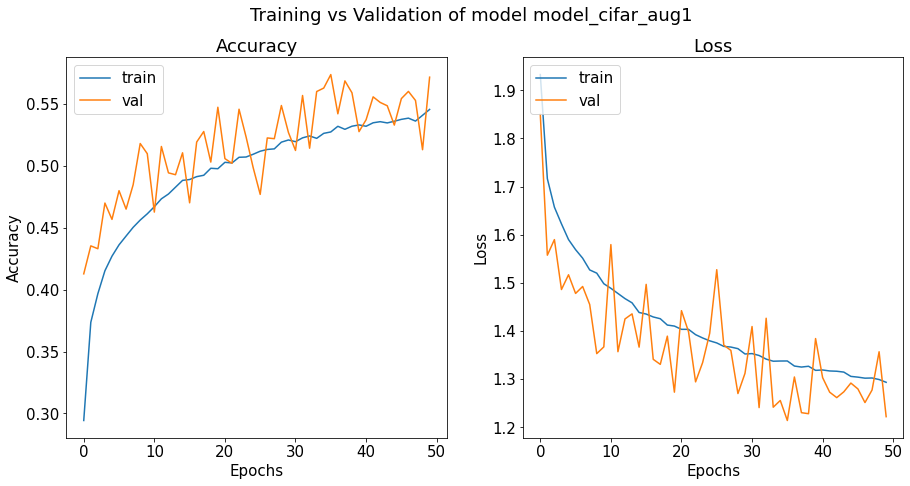

In [ ]:
plot_history(experiment_name)

##### Shallow convnet with tf.images augmentation

In [ ]:
IMAGE_SIZE = 32

def augment_shallow(image, label):
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.random_flip_left_right(image)
  image = tf.image.random_flip_up_down(image)
  image = tf.image.rot90(image)
  return image, label

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train)) 
test_ds = tf.data.Dataset.from_tensor_slices((X_test, y_test))

train_batches = train_ds.map(augment_shallow).batch(BATCH_SIZE).cache().shuffle(buffer_size=BUFFER_SIZE).repeat().prefetch(AUTOTUNE)
test_batches = test_ds.map(pre_process_image).batch(BATCH_SIZE).cache().repeat().prefetch(AUTOTUNE)

In [ ]:
print('batch_size: {0} #Epochs: {1} steps_per_epoch: {2} validation_steps: {3}'.format(BATCH_SIZE, NUM_EPOCHS, STEPS_PER_EPOCH, VALIDATION_STEPS))

experiment_name = 'model_cifar_aug2'

# make model shallow cnn augmented with tf.images
model_cifar_aug2 = make_shallow_model_cnn()

model_cifar_aug2.compile(optimizer=tf.keras.optimizers.Adam(LR_SCHEDULE), loss='categorical_crossentropy', metrics=['accuracy'])

tf.keras.backend.clear_session()
start_time = time.time()

model_history = model_cifar_aug2.fit(
    train_batches, 
    steps_per_epoch=STEPS_PER_EPOCH, 
    epochs=NUM_EPOCHS,
    validation_data=test_batches,
    validation_steps=VALIDATION_STEPS,
    callbacks=get_callbacks(experiment_name),
    verbose=1)

train_time = (time.time() - start_time)/60
print('Training time (in minutes): ', train_time)

histories[experiment_name] = model_history.history

file_name = model_dir + experiment_name
model_cifar_aug2.save(file_name + '.h5')
save_model_history(histories[experiment_name], file_name + '.pickle')

batch_size: 128 #Epochs: 100 steps_per_epoch: 390.625 validation_steps: 78.125
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 32, 32, 32)        896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 16, 16, 32)        9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 8, 8, 32)          0         
_________________________________________________________________
dropout (Dropout)            (None, 8, 8, 32)          0         
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0         
___________________________________________

In [ ]:
save_experiment_result(df, model_cifar_aug2, experiment_name, 'cifar', 'Shallow cifar tf.images augmentation', train_time)

In [ ]:
model_cifar_aug2 = load_model('model_cifar_aug2')

models/model_cifar_aug2.pickle


In [ ]:
# testing accuracy
model_cifar_aug2.evaluate(testing_batches)

1/1 [==============================] - 0s 117ms/step - loss: 0.6091 - accuracy: 0.7800


[0.6091476678848267, 0.7799999713897705]

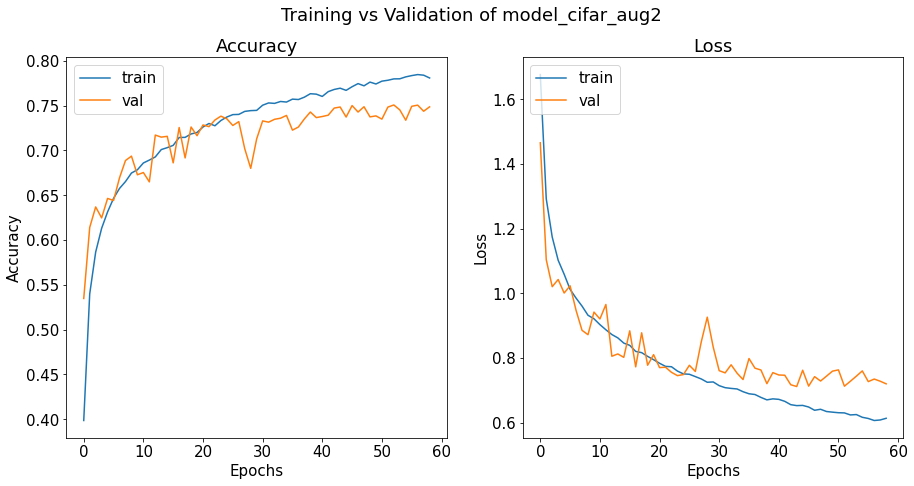

In [ ]:
# plot history
plot_history(experiment_name)

In [ ]:
# Testing accuracy
model_cifar_aug2.evaluate(testing_batches)

1/1 [==============================] - 0s 207ms/step - loss: 2.6031 - accuracy: 0.3200


[2.6031408309936523, 0.3199999928474426]

##### Shallow convnet with ImageDataGenerator augmentation

In [ ]:
def get_ImageDataGenerator_simple():
     return ImageDataGenerator(
        rotation_range=20,
        horizontal_flip=True,
        vertical_flip=True)

model_cifar_aug3 = make_shallow_model_cnn()
    
adam=tf.keras.optimizers.Adam(LR_SCHEDULE) # with inversetimedecay or exponentialtimedelay
model_cifar_aug3.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

datagen = get_ImageDataGenerator_simple()

experiment_name = 'model_cifar_aug3'

datagen.fit(X_train)

tf.keras.backend.clear_session()

start_time = time.time()

# fit the model on the batches generated by datagen.flow().
model_history = model_cifar_aug3.fit(x=datagen.flow(X_train, y_train, batch_size=BATCH_SIZE),
          epochs=NUM_EPOCHS,
          validation_data=(X_test, y_test),
          steps_per_epoch=STEPS_PER_EPOCH,
          callbacks=get_callbacks(experiment_name),
          verbose=2
)
train_time = (time.time() - start_time)/60
print('Training time (in minutes): ', train_time)

histories[experiment_name] = model_history.history

file_name = model_dir + experiment_name
model_cifar_aug3.save(file_name + '.h5')
save_model_history(histories[experiment_name], file_name + '.pickle')     


In [ ]:
save_experiment_result(df, model_cifar_aug3, experiment_name, 'cifar', 'Shallow cifar tf.images augmentation', train_time)

In [ ]:
model_cifar_aug3 = load_model('model_cifar_aug3')

models/model_cifar_aug3.pickle


In [ ]:
# testing accuracy
model_cifar_aug3.evaluate(testing_batches)

1/1 [==============================] - 0s 222ms/step - loss: 0.9966 - accuracy: 0.6900


[0.9965702891349792, 0.6899999976158142]

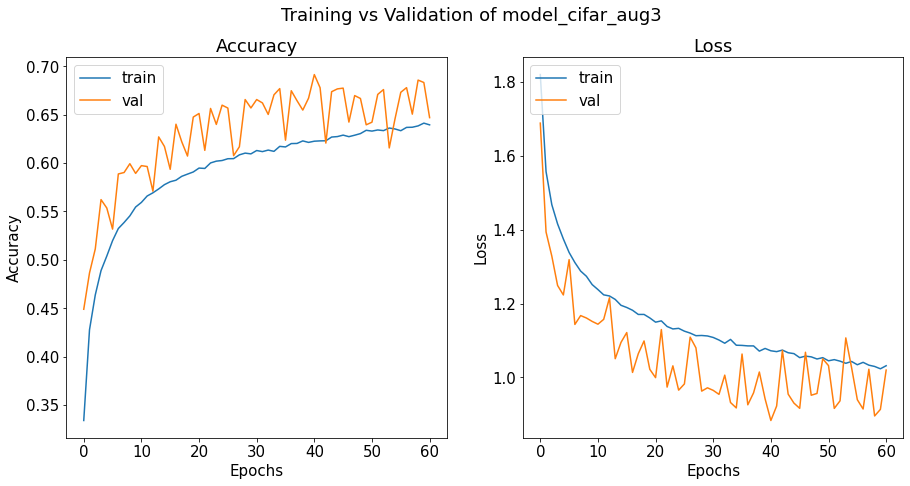

In [ ]:
plot_history(experiment_name)

#### Task 2.1.3 Train a ResNet

I use keras resnet50V2. ResNet50V2 is a modified version of ResNet50 that performs better than ResNet50 and ResNet101 on the ImageNet dataset. In ResNet50V2, a modification was made in the propagation formulation of the connections between blocks.  I set pretrained weight to none for ResNet experiments. 

In deep learning, if we increase the depth, we can get better performance, better generalisation, decreased loss and accuracy, but the optimisation is harder. Several experiments have proven that deeper the layers. it increases both train and test accuracy but at a certain point both train and test accuracy stop increasing, that's because now the added layers just need to learn the identity functions from the previous layers

Here comes ResNet proposed theory to overcome the problem of dimishing gradients. 

A building block of a ResNet is called a residual block or identity block. A residual block is simply when the activation of a layer is fast-forwarded to a deeper layer in the neural network.










In [ ]:

# Load cifar for resnet

X_train, y_train, X_test, y_test  = load_cifar_data(batch_size=128)

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
      
test_ds = tf.data.Dataset.from_tensor_slices((X_test, y_test))

set_lr_schedule() # use Inverse Time decay

170508288/170498071 [==============================] - 2s 0us/step


In [ ]:
IMAGE_SIZE = 32 # minimum size for ResNet is 32 and it's original size in cifar-10

conv_base_resnet = ResNet50V2(weights=None,
                  include_top=False,
                  input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3)) #default 224, 224, min size for Keras ResNet = 32

conv_base_resnet.summary()

Model: "resnet50v2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
pool1_pad (ZeroPadding2D)       (None, 114, 114, 64) 0           conv1_conv[0][0]                 
_________________________________________________________________________________________

In [ ]:
weight_decay = 1e-4

def make_model_resnet():
    model = models.Sequential()
    model.add(conv_base_resnet)
    model.add(layers.Flatten())
    print(model.summary()) #output 2048 neurons

    model.add(layers.Dense(2000,activation=('relu'),input_dim=2048))
    model.add(layers.Dropout(.4))
    model.add(layers.Dense(1000,activation=('relu'),kernel_regularizer=regularizers.l2(weight_decay))) 
    model.add(layers.Dropout(.3))  
    model.add(layers.Dense(500,activation=('relu'),kernel_regularizer=regularizers.l2(weight_decay)))
    model.add(layers.Dropout(.2))
    model.add(layers.Dense(10,activation=('softmax')))

    return model

##### Resnet - Cifar - Adam - No augmentation

In [ ]:
train_batches = train_ds.map(pre_process_image).batch(BATCH_SIZE).cache().shuffle(buffer_size=BUFFER_SIZE).repeat().prefetch(AUTOTUNE)
test_batches = test_ds.map(pre_process_image).batch(BATCH_SIZE).cache().repeat().prefetch(AUTOTUNE)

In [ ]:
conv_base_resnet.trainable = True

model_cifar_resnet = make_model_resnet()
    
adam=tf.keras.optimizers.Adam(LR_SCHEDULE) # with inversetimedecay or exponentialtimedelay
model_cifar_resnet.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50v2 (Functional)      (None, 1, 1, 2048)        23564800  
_________________________________________________________________
flatten_2 (Flatten)          (None, 2048)              0         
Total params: 23,564,800
Trainable params: 23,519,360
Non-trainable params: 45,440
_________________________________________________________________
None


In [ ]:
# Fit Resnet Weight=none no augmentation
print('batch_size: {0} #Epochs: {1} steps_per_epoch: {2} validation_steps: {3}'.format(BATCH_SIZE, NUM_EPOCHS, STEPS_PER_EPOCH, VALIDATION_STEPS))

experiment_name = 'model_cifar_resnet'

tf.keras.backend.clear_session()

tf.keras.backend.clear_session()

start_time = time.time()
model_history = model_cifar_resnet.fit(
      train_batches,
      steps_per_epoch=STEPS_PER_EPOCH,
      epochs=NUM_EPOCHS,
      validation_data=test_batches,
      validation_steps=VALIDATION_STEPS,
      callbacks=get_callbacks(experiment_name),
      verbose=2
      )

train_time = (time.time() - start_time)/60
print('Training time:', train_time)

histories[experiment_name] = model_history.history

file_name = model_dir + experiment_name
model_cifar_resnet.save(file_name + '_.h5')
save_model_history(histories[experiment_name], file_name + '_.pickle')

batch_size: 128 #Epochs: 200 steps_per_epoch: 390.625 validation_steps: 78.125


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 1/200
390/390 - 110s - loss: 1.9513 - accuracy: 0.3379 - val_loss: 1.9888 - val_accuracy: 0.3514
Epoch 2/200
390/390 - 61s - loss: 1.4939 - accuracy: 0.5073 - val_loss: 10.4562 - val_accuracy: 0.2704
Epoch 3/200
390/390 - 59s - loss: 1.3067 - accuracy: 0.5726 - val_loss: 1.5649 - val_accuracy: 0.4808
Epoch 4/200
390/390 - 61s - loss: 1.1159 - accuracy: 0.6413 - val_loss: 1.8526 - val_accuracy: 0.4736
Epoch 5/200
390/390 - 61s - loss: 0.9523 - accuracy: 0.6951 - val_loss: 1.3416 - val_accuracy: 0.5847
Epoch 6/200
390/390 - 61s - loss: 0.9525 - accuracy: 0.6960 - val_loss: 1.6992 - val_accuracy: 0.4827
Epoch 7/200
390/390 - 59s - loss: 0.7882 - accuracy: 0.7508 - val_loss: 1.0423 - val_accuracy: 0.6672
Epoch 8/200
390/390 - 61s - loss: 0.9132 - accuracy: 0.7071 - val_loss: 1.6191 - val_accuracy: 0.5640
Epoch 9/200
390/390 - 59s - loss: 0.7250 - accuracy: 0.7728 - val_loss: 0.9373 - val_accuracy: 0.7058
Epoch 10/200
390/390 - 59s - loss: 0.5758 - accuracy: 0.8190 - val_loss: 1.2102 

In [ ]:
# load models and history
model_cifar_resnet = load_model('model_cifar_resnet')

models/model_cifar_resnet.pickle


In [ ]:
# testing accuracy
model_cifar_resnet.evaluate(testing_batches)

1/1 [==============================] - 1s 1s/step - loss: 1.3723 - accuracy: 0.7500


[1.3722578287124634, 0.75]

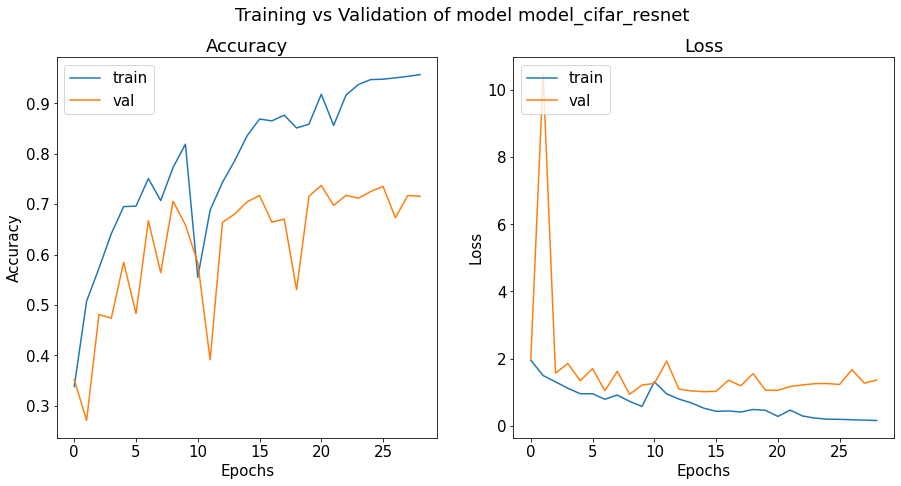

In [ ]:
plot_history(experiment_name)

In [ ]:
save_experiment_result(df, model_cifar_resnet, experiment_name, 'cifar', 'Resnet cifar no augmentation', train_time)

##### Resnet - with augmentation

In [ ]:
# Fit with augmentation tf.images

# augmentation
train_batches = train_ds.map(augment_image).batch(BATCH_SIZE).cache().shuffle(buffer_size=BUFFER_SIZE).repeat().prefetch(AUTOTUNE)
test_batches = test_ds.map(pre_process_image).batch(BATCH_SIZE).cache().repeat().prefetch(AUTOTUNE)

conv_base_resnet.trainable = True 

model_resnet_aug = make_model_resnet()
    
adam=tf.keras.optimizers.Adam(LR_SCHEDULE)

model_resnet_aug.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

tf.keras.backend.clear_session()

start_time = time.time()

experiment_name = 'model_resnet_aug'

model_history = model_resnet_aug.fit( 
          train_batches, 
          batch_size=BATCH_SIZE,
          epochs=NUM_EPOCHS,
          steps_per_epoch=STEPS_PER_EPOCH,
          validation_data=test_batches,
          validation_steps=VALIDATION_STEPS,
          callbacks=get_callbacks(experiment_name),
          verbose=1
)
train_time = (time.time() - start_time)/60
print('Training time (in minutes): ', train_time)

histories[experiment_name] = model_history.history

file_name = model_dir + experiment_name
model_resnet_aug.save(file_name + '.h5')
save_model_history(histories[experiment_name], file_name + '.pickle')

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50v2 (Functional)      (None, 1, 1, 2048)        23564800  
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0         
Total params: 23,564,800
Trainable params: 23,519,360
Non-trainable params: 45,440
_________________________________________________________________
None


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 1/100
390/390 [==============================] - 83s 184ms/step - loss: 1.8645 - accuracy: 0.3899 - val_loss: 1.7349 - val_accuracy: 0.4477
Epoch 2/100
390/390 [==============================] - 62s 158ms/step - loss: 1.4877 - accuracy: 0.5126 - val_loss: 7.6648 - val_accuracy: 0.3266
Epoch 3/100
390/390 [==============================] - 64s 164ms/step - loss: 1.3003 - accuracy: 0.5705 - val_loss: 1.6532 - val_accuracy: 0.4850
Epoch 4/100
390/390 [==============================] - 64s 164ms/step - loss: 1.1402 - accuracy: 0.6288 - val_loss: 1.4150 - val_accuracy: 0.5520
Epoch 5/100
390/390 [==============================] - 62s 158ms/step - loss: 1.0193 - accuracy: 0.6750 - val_loss: 2.8088 - val_accuracy: 0.1516
Epoch 6/100
390/390 [==============================] - 64s 164ms/step - loss: 1.1454 - accuracy: 0.6283 - val_loss: 1.3740 - val_accuracy: 0.5600
Epoch 7/100
390/390 [==============================] - 62s 158ms/step - loss: 1.0297 - accuracy: 0.6664 - val_loss: 1.2604 -

In [ ]:
# load models and history
model_resnet_aug = load_model('model_resnet_aug')

models/model_resnet_aug.pickle


In [ ]:
model_resnet_aug.evaluate(testing_batches)

1/1 [==============================] - 0s 118ms/step - loss: 1.0581 - accuracy: 0.7400


[1.0581204891204834, 0.7400000095367432]

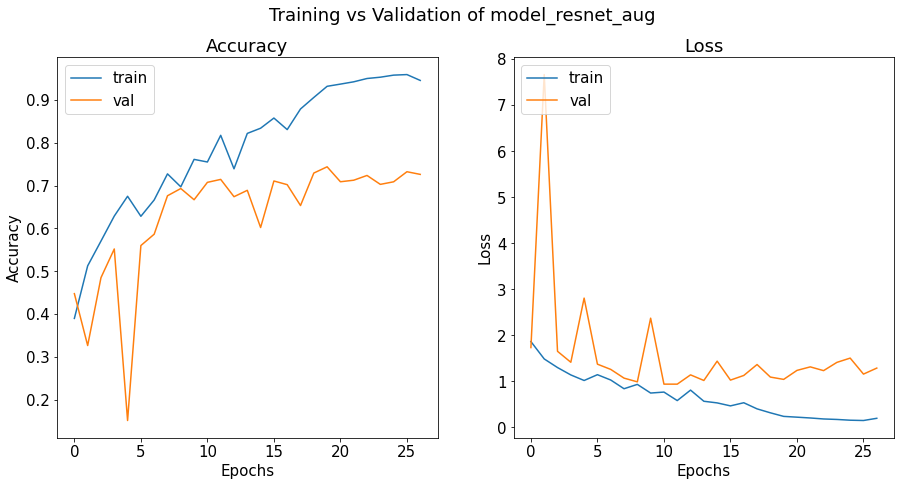

In [ ]:
plot_history(experiment_name)

##### Resnet - SGD - tf.image - size 64

I also experimented with an SGD optimiser. The ResNet paper implemented a model SGD with momentum. 

When I ran the experiment only with SGD Optimiser with a learning rate 0.01 and momentum 0.9. It was overfitting, the validation accuracy was around 20%.

After I added ReduceLROnPlateau learning schedule, the model trained well. The result was comparable with the result from Adam optimiser with InverseTimeDecay learning schedule. The test accuracy was 74% for Adam model and 73% for SGD model. 

Because there was no improvement using SGD model, I decided to continue using Adam optimiser with InverseTimeDecay learning schedule.

In [ ]:
train_batches = train_ds.map(augment_image).batch(BATCH_SIZE).cache().shuffle(buffer_size=BUFFER_SIZE).repeat().prefetch(AUTOTUNE)
test_batches = test_ds.map(pre_process_image).batch(BATCH_SIZE).cache().repeat().prefetch(AUTOTUNE)

conv_base_resnet.trainable = True
model_resnet_sgd = make_model_resnet()
    
opt = tf.optimizers.SGD(learning_rate=0.01, momentum=0.9)
model_resnet_sgd.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])
model_resnet_sgd.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50v2 (Functional)      (None, 2, 2, 2048)        23564800  
_________________________________________________________________
flatten (Flatten)            (None, 8192)              0         
Total params: 23,564,800
Trainable params: 23,519,360
Non-trainable params: 45,440
_________________________________________________________________
None
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50v2 (Functional)      (None, 2, 2, 2048)        23564800  
_________________________________________________________________
flatten (Flatten)            (None, 8192)              0         
_________________________________________________________________
dense (Dense)                (None, 2000)              16386000  
______________

In [ ]:
# Fit Resnet SGD tf.image 

print('batch_size: {0} #Epochs: {1} steps_per_epoch: {2} validation_steps: {3}'.format(BATCH_SIZE, NUM_EPOCHS, STEPS_PER_EPOCH, VALIDATION_STEPS))
train_batches = train_ds.map(augment_image).batch(BATCH_SIZE).cache().shuffle(buffer_size=BUFFER_SIZE).repeat().prefetch(AUTOTUNE)
test_batches = test_ds.map(pre_process_image).batch(BATCH_SIZE).cache().repeat().prefetch(AUTOTUNE)

experiment_name = 'model_resnet_sgd'

tf.keras.backend.clear_session()

start_time = time.time()
model_history = model_resnet_sgd.fit(
      train_batches,
      steps_per_epoch=STEPS_PER_EPOCH,
      epochs=NUM_EPOCHS,
      validation_data=test_batches,
      validation_steps=VALIDATION_STEPS,
      callbacks=get_callbacks_rl(experiment_name),
      verbose=1
      )

train_time = (time.time() - start_time)/60
print('Training time:', train_time)

histories[experiment_name] = model_history.history

file_name = model_dir + experiment_name
model_resnet_sgd.save(file_name + '.h5')
save_model_history(histories[experiment_name], file_name + '.pickle')

##### Reduce learning rate dynamicly

I Qdded ReduceLROnPlateau function to the callback to reduce learning rate. This technique improved significantly the result.



In [ ]:
model_resnet_sgd = load_model('model_resnet_sgd')

models/model_resnet_sgd.pickle


In [ ]:
model_resnet_sgd.evaluate(testing_batches64)

1/1 [==============================] - 1s 766ms/step - loss: 1.2980 - accuracy: 0.7300


[1.2979680299758911, 0.7300000190734863]

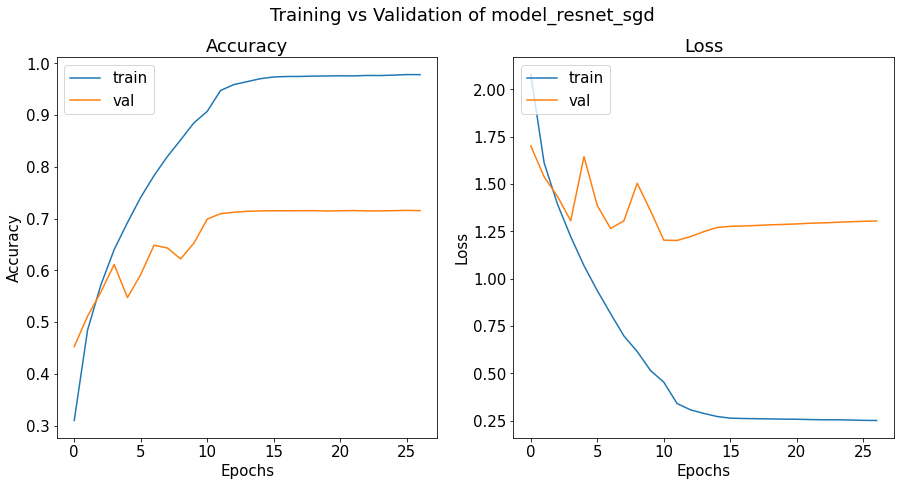

In [ ]:
plot_history(experiment_name)

### Task 2.2 Fast training of ResNet

I have implemented InverseTimeDecay learning schedule in my experiments. It's proven to cut down the training time and get the best state of the model by monitoring the validation loss. 

For this task, I will explore Lookahead optimiser and also run a couple of experiments in tpu for large input images.





##### **Lookahead optimiser**

The mechanism is proposed by Michael R. Zhang et.al in the paper Lookahead Optimizer: k steps forward, 1 step back. 

LookAhead maintains two sets of weights and then interpolates between them. The faster set of weights is able to lookahead and explore while the slower weights stay behind to provide longer term stability.

The study claimed the optimizer has less hyper-parameters tuning (works well with default params), faster convergence rate and better results.

For this task, I conducted two experiments
- Resnet pretrained, lookahead optimiser with Adam optimiser - default learning rate 0.001, input images size 32x32, run on GPU
- Resnet pretrained, lookahead optimiser with Adam optimiser - default learning rate 0.001, input images size 224 x 224, run on TPU



In [ ]:
# Fit with lookahead optimizer

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
test_ds = tf.data.Dataset.from_tensor_slices((X_test, y_test))

train_batches = train_ds.batch(BATCH_SIZE).cache().shuffle(buffer_size=BUFFER_SIZE).repeat().prefetch(AUTOTUNE)
test_batches = test_ds.batch(BATCH_SIZE).cache().repeat().prefetch(AUTOTUNE)

NUM_EPOCHS = 50

conv_base_resnet.trainable = True

model_resnet_look = make_model_resnet()

adam=tf.keras.optimizers.Adam() 
opt = tfa.optimizers.Lookahead(adam)

model_resnet_look.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])
model_resnet_look.summary()
tf.keras.backend.clear_session()

start_time = time.time()

experiment_name = 'model_resnet_look'

model_history = model_resnet_look.fit(
          train_batches, 
          batch_size=BATCH_SIZE,
          epochs=NUM_EPOCHS,
          steps_per_epoch=STEPS_PER_EPOCH,
          validation_data=test_batches,
          validation_steps=VALIDATION_STEPS,
          callbacks=get_callbacks(experiment_name),
          verbose=1
)
train_time = (time.time() - start_time)/60
print('Training time (in minutes): ', train_time)

histories[experiment_name] = model_history.history

file_name = model_dir + experiment_name
model_resnet_look.save(file_name + '.h5')
save_model_history(histories[experiment_name], file_name + '.pickle')

In [ ]:
# load models and history
model_resnet_look = load_model('model_resnet_look')

models/model_resnet_look.pickle


In [ ]:
model_resnet_look.evaluate(testing_batches)

1/1 [==============================] - 2s 2s/step - loss: 1.0438 - accuracy: 0.7300


[1.0438140630722046, 0.7300000190734863]

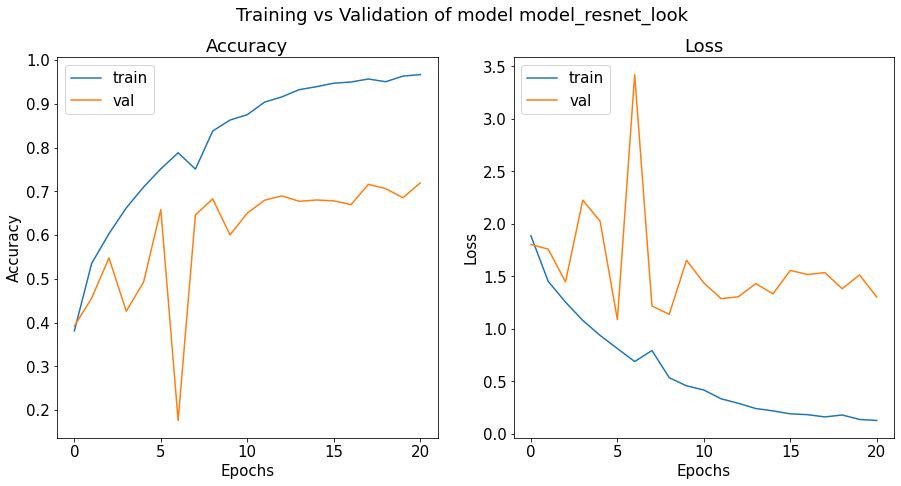

In [ ]:
plot_history(experiment_name)

#### Resnet with TPU

TPU(Tensor Processing Unit) was developed by Google to provide high computational power to train machine learning and deep learning models. 



In [ ]:
# Resnet with TPU
IMAGE_SIZE = 224

with strategy.scope():

  conv_base_resnet = ResNet50V2(weights=None,
                  include_top=False,
                  input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))

  conv_base_resnet.trainable = True

  model_resnet = make_model_resnet()

  adam=tf.keras.optimizers.Adam()
  opt = tfa.optimizers.Lookahead(adam)

  #change optimizer with opt or adam as your experiment need
  model_resnet.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

  model_resnet.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50v2 (Functional)      (None, 7, 7, 2048)        23564800  
_________________________________________________________________
flatten (Flatten)            (None, 100352)            0         
Total params: 23,564,800
Trainable params: 23,519,360
Non-trainable params: 45,440
_________________________________________________________________
None
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50v2 (Functional)      (None, 7, 7, 2048)        23564800  
_________________________________________________________________
flatten (Flatten)            (None, 100352)            0         
_________________________________________________________________
dense (Dense)                (None, 2000)              200706000 
______________

In [ ]:
# Fit in TPU

NUM_EPOCHS = 50
IMAGE_SIZE = 224
experiment_name = 'model_resnet_tpu' #'model_resnet_tpu_look'

train_batches = train_ds.map(pre_process_image).batch(BATCH_SIZE).cache().shuffle(buffer_size=BUFFER_SIZE).prefetch(AUTOTUNE)
test_batches = test_ds.map(pre_process_image).batch(BATCH_SIZE).cache().prefetch(AUTOTUNE)

tf.keras.backend.clear_session()

start_time = time.time()

model_history = model_resnet.fit( 
          train_batches, 
          batch_size=BATCH_SIZE,
          epochs=NUM_EPOCHS,
          validation_data=test_batches,
          callbacks=get_callbacks(experiment_name),
          verbose=1
)

print('end time:', time.time())

train_time = (time.time() - start_time)/60
print('Training time (in minutes): ', train_time)

histories[experiment_name] = model_history.history

file_name = model_dir + experiment_name
model_resnet.save(file_name + '.h5')
save_model_history(histories[experiment_name], file_name + '.pickle')

In [ ]:
model_resnet_tpu = load_model('model_resnet_tpu')

models/model_resnet_tpu.pickle


In [ ]:
#Testing accuracy
model_resnet_tpu.evaluate(testing_batches224)

1/1 [==============================] - 9s 9s/step - loss: 1.2002 - accuracy: 0.8100


[1.2002290487289429, 0.8100000023841858]

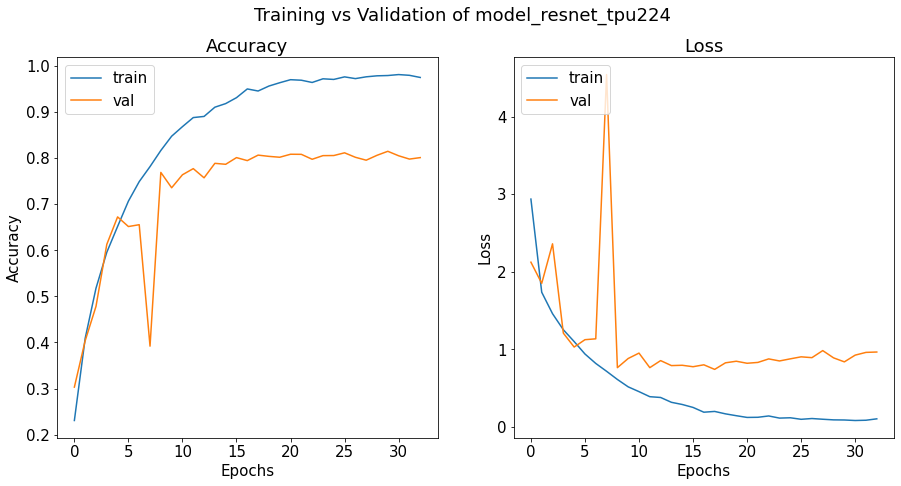

In [ ]:
plot_history(experiment_name)

####Lookahead with TPU

Use the same code as above, I only changed the optimizer from adam to lookahead

In [ ]:
model_resnet_tpu_look = load_model('model_resnet_tpu_look')

models/model_resnet_tpu_look.pickle


In [ ]:
#Testing accuracy - with lookahead and 224 image sizes
model_resnet_tpu_look.evaluate(testing_batches224)

1/1 [==============================] - 8s 8s/step - loss: 0.5304 - accuracy: 0.8700


[0.530433177947998, 0.8700000047683716]

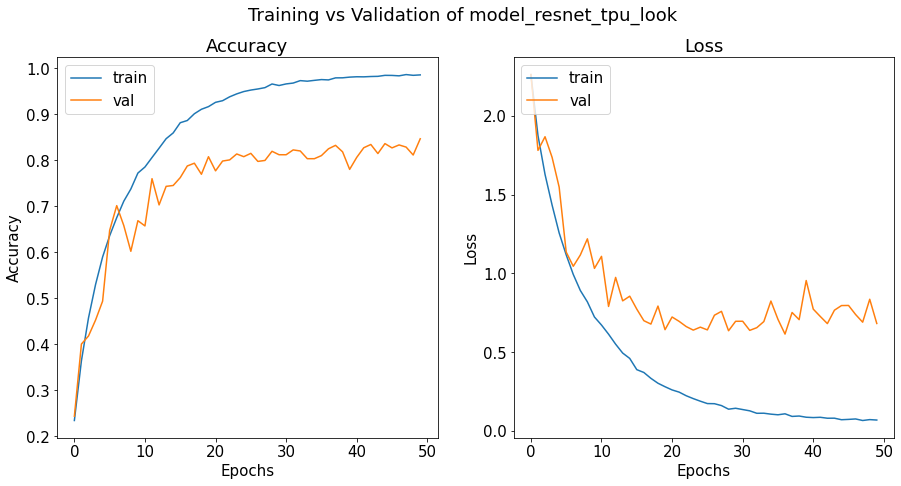

In [ ]:
plot_history(experiment_name)

### Task 2.3 Performance comparison





####TPU and GPU

TPU could handle large image sizes 224x224, which was crashed on GPU. TPU processed training much faster. As per the information provided by Google’s Colab documentation, A GPU provides 1.8TFlops and has a 12GB RAM while TPU delivers 180TFlops and provides a 64GB RAM.

Both GPU and TPU time resources are limited and inconsistent on free Google Colab. 








####Lookahead or InverseTimeDecay

For image size 32x32, ran on the GPU

Adam optimiser with InverseTimeDecay learning schedule (model_cifar_resnet) had slightly better accuracy 0.75 compare to Lookahead optimiser (model_resnet_look) 0.73. 

For image size 224x224, ran on TPU

Lookahead optimiser (model_resnet_tpu_look) had better accuracy 0.87 compare to Adam optimiser (model_resnet_tpu) 0.81. 







In [ ]:
df = load_csv()

df_look_tpu = df[df['model'].isin(['model_resnet_tpu', 'model_resnet_tpu_look'])]
print(df_look_tpu[['model','time', 'test_acc', 'test_loss']])

df_look_gpu = df[df['model'].isin(['model_cifar_resnet', 'model_resnet_look'])]
df_look_gpu[['model','time', 'test_acc', 'test_loss']]


                    model   time  test_acc  test_loss
14       model_resnet_tpu  28.34      0.81     1.2002
15  model_resnet_tpu_look  38.37      0.87     0.5304


,model,time,test_acc,test_loss
10,model_cifar_resnet,34.533783,0.75,1.3723
13,model_resnet_look,38.000000,0.73,1.0438


In [ ]:
df_cifar = df[df['data']=='cifar']

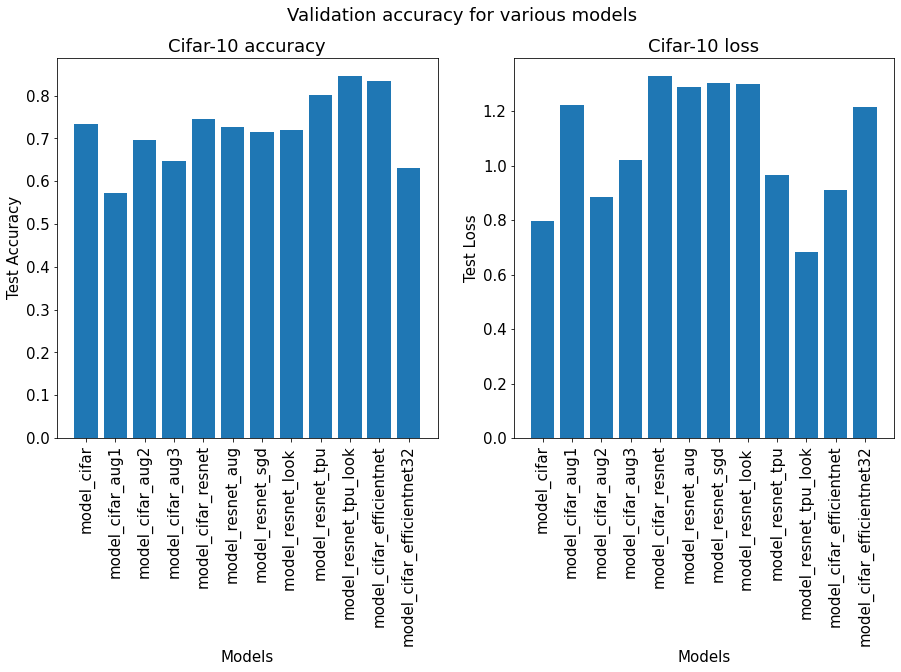

In [ ]:
fig = plt.figure(figsize=(15, 7))

fig.suptitle('Validation accuracy for various models')

ax1 = plt.subplot(1, 2, 1)
ax1.bar(df_cifar['model'],df_cifar['val_accuracy'])
ax1.set_xlabel('Models')
ax1.set_ylabel('Test Accuracy')
ax1.set_title('Cifar-10 accuracy')
ax1.set_xticklabels(df_cifar['model'], rotation=90)

ax2 = plt.subplot(1, 2, 2)
ax2.bar(df_cifar['model'],df_cifar['val_loss'])
ax2.set_xlabel('Models')
ax2.set_ylabel('Test Loss')
ax2.set_title('Cifar-10 loss')
ax2.set_xticklabels(df_cifar['model'], rotation=90)

plt.show()

####Shallow ConvNet or Resnet

The comparison used the same image sizes 32x32 and without augmentation.

The test accuracy for both models were the same (0.75), the test loss for a shallow ConvNet (0.68) was slighly better (1.37). However, the total parameters for Resnet was much higher (30169310) compare to shallow ConvNet (273,706) and the training run spent much longer in Resnet 34.5 minutes compare to 4.5 minutes in shallow ConvNet

I haven't had a chance to experiment with higher image sizes with shallow ConvNet. From my Resnet experiments, it proved that higher image sizes  gives better results.


In [ ]:
df_shallow = df[df['model'].isin(['model_cifar', 'model_cifar_resnet'])]
df_shallow[['model','total_params','time', 'test_acc', 'test_loss']]


,model,total_params,time,test_acc,test_loss
6,model_cifar,"273,706",4.471507,0.75,0.6819
10,model_cifar_resnet,30169310,34.533783,0.75,1.3723


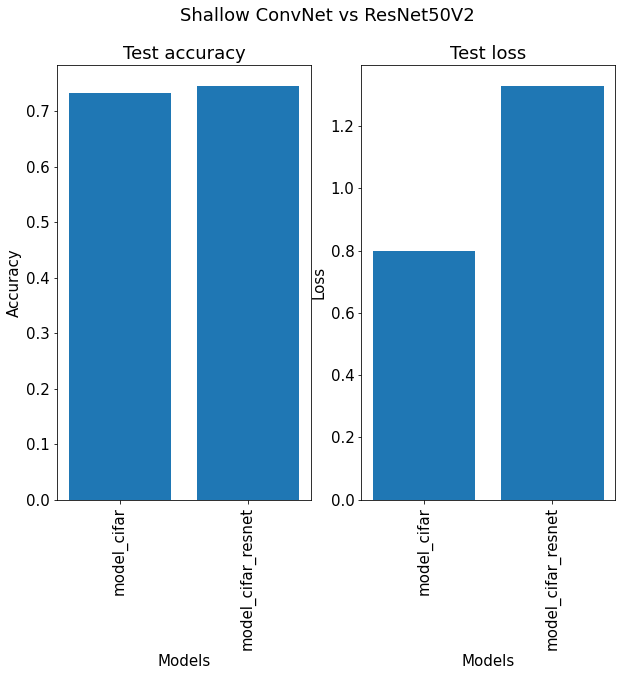

In [ ]:
fig = plt.figure(figsize=(10, 8))

fig.suptitle('Shallow ConvNet vs ResNet50V2')

ax1 = plt.subplot(1, 2, 1)
ax1.bar(df_shallow['model'],df_shallow['val_accuracy'])
ax1.set_xlabel('Models')
ax1.set_ylabel('Accuracy')
ax1.set_title('Test accuracy')
ax1.set_xticklabels(df_shallow['model'], rotation=90)

ax2 = plt.subplot(1, 2, 2)
ax2.bar(df_shallow['model'],df_shallow['val_loss'])
ax2.set_xlabel('Models')
ax2.set_ylabel('Loss')
ax2.set_title('Test loss')
ax2.set_xticklabels(df_shallow['model'], rotation=90)

plt.show()

#### All models on cifar-10

The results from my experiments:

* The best test accuracy and test loss was **model_resnet_tpu_look**, a Resnet model with image size 224x224, compiled with Lookahead optimizer and run on TPU

* Resnet with image size 224 has the most number of parameters with 226,777,310	total parameters, compare to Shallow ConvNet with the least number of total parameters 273,706

* The higher the image input sizes, the better is the accuracy. The test accuracy(81%) for ResNet was higher than the test accuracy(75%) for ResNet 32x32

* The augmentation didn't increase the accuracy in my experiments. Further augmentation experiments were needed.








In [ ]:
df_cifar = df[df['data']=='cifar'][['model', 'total_params', 'time', 'test_acc', 'test_loss', 'description']]
df_cifar_acc = df_cifar.sort_values(by=['test_acc'], ascending=False)
df_cifar_loss = df_cifar.sort_values(by=['test_loss'])
df_cifar_acc

,model,total_params,time,test_acc,test_loss,description
15,model_resnet_tpu_look,226777310,38.37,0.87,0.5304,Resnet TPU lookahead no_aug imgsize_224
16,model_cifar_efficientnet,131998081,22.70,0.84,1.2076,Efficientnet TPU no_aug imgsize_224
14,model_resnet_tpu,226777310,28.34,0.81,1.2002,Resnet TPU no_aug imgsize_224
8,model_cifar_aug2,273706,4.50,0.78,0.6091,Shallow cifar tf.images_aug
6,model_cifar,273706,4.47,0.75,0.6819,Shallow convnet cifar
10,model_cifar_resnet,30169310,34.53,0.75,1.3723,Resnet basic no_aug adam
11,model_resnet_aug,30169310,33.02,0.74,1.0581,Resnet tf.images_aug imgsize_32 adam
12,model_resnet_sgd,42457310,62.35,0.73,1.2980,Resnet SGD learningRate imgsize_64
13,model_resnet_look,30169310,38.00,0.73,1.0438,Resnet lookahead no_aug
9,model_cifar_aug3,273706,26.88,0.69,0.9966,Shallow cifar ImgDataGen_aug


In [ ]:
df_cifar_params = df_cifar.sort_values(by=['total_params'], ascending=False)
df_cifar_params

,model,total_params,time,test_acc,test_loss,description
14,model_resnet_tpu,226777310,28.34,0.81,1.2002,Resnet TPU no_aug imgsize_224
15,model_resnet_tpu_look,226777310,38.37,0.87,0.5304,Resnet TPU lookahead no_aug imgsize_224
16,model_cifar_efficientnet,131998081,22.70,0.84,1.2076,Efficientnet TPU no_aug imgsize_224
12,model_resnet_sgd,42457310,62.35,0.73,1.2980,Resnet SGD learningRate imgsize_64
10,model_cifar_resnet,30169310,34.53,0.75,1.3723,Resnet basic no_aug adam
11,model_resnet_aug,30169310,33.02,0.74,1.0581,Resnet tf.images_aug imgsize_32 adam
13,model_resnet_look,30169310,38.00,0.73,1.0438,Resnet lookahead no_aug
17,model_cifar_efficientnet32,9118081,8.66,0.62,1.1445,Efficientnet no_aug imgsize_32
6,model_cifar,273706,4.47,0.75,0.6819,Shallow convnet cifar
7,model_cifar_aug1,273706,4.40,0.56,1.2070,Shallow cnn preprocessing_aug


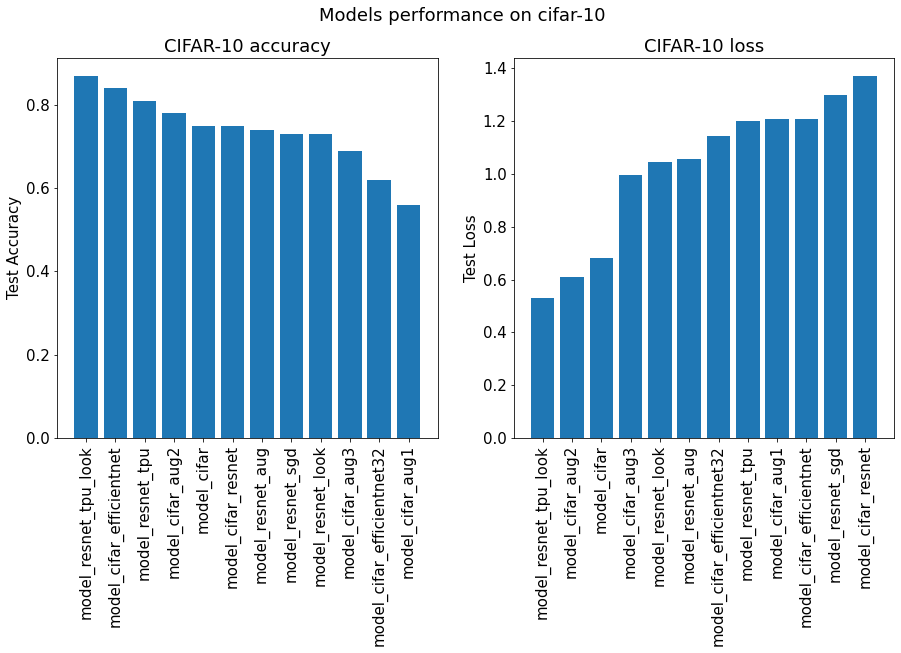

In [ ]:
fig = plt.figure(figsize=(15, 7))

fig.suptitle('Models performance on cifar-10')

ax1 = plt.subplot(1, 2, 1)
ax1.bar(df_cifar_acc['model'],df_cifar_acc['test_acc'])
ax1.set_ylabel('Test Accuracy')
ax1.set_title('CIFAR-10 accuracy')
ax1.set_xticklabels(df_cifar_acc['model'], rotation=90)

ax2 = plt.subplot(1, 2, 2)
ax2.bar(df_cifar_loss['model'],df_cifar_loss['test_loss'])
ax2.set_ylabel('Test Loss')
ax2.set_title('CIFAR-10 loss')
ax2.set_xticklabels(df_cifar_loss['model'], rotation=90)

plt.show()


## Task 3 (**HD level task**) Research on new models


####The Objectives of EfficientNet

The main issue that EfficientNet aims to address is how to properly scale up ConvNet network to get better accuracy model, reduce the number of parameters and have faster training runs.

Here is the background of the issues:
* We can get better accuracy from a ConvNet model by making the network deeper, by using more parameters or by using higher image input resolution. However, all these cost us more resources and make it easier for us to hit the hardware memory limit. 
* Normally, we scale up one of these three dimensions. It is possible to scale two or all the three dimensions but it requires tedious manual work and is not well understood.
* Designing efficient mobile-size ConvNets becomes increasingly popular

The study proposed a new scaling method that uniformly scales all dimensions of depth/width/resolution with compound coefficient.













####EfficientNet Architecture

The researchers first designed a baseline network by performing the neural architecture search, then scaled up this baseline network to obtain a family of deep learning models, called EfficientNets (B0 to B7). 

They used a grid search strategy to find the relationship between the different scaling dimensions of the baseline network under a fixed resource constraint. 

Using this strategy, they were able to find the appropriate scaling coefficients for each of the dimensions to be scaled-up. Using these coefficients, the baseline network was scaled by the desired size.

Below is the architecture of EfficientNetB0.



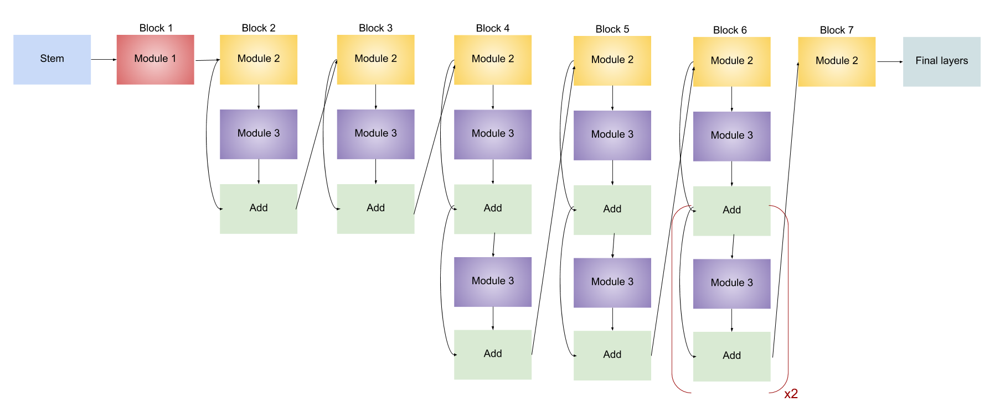







Architecture for EfficientNet-B0. (x2 means that modules inside the bracket 
(source: https://towardsdatascience.com/complete-architectural-details-of-all-efficientnet-models-5fd5b736142)

##### The algoritm can be found below


For example we want to increase by $2^n$, so we have $\alpha^n$ depth increase, $\beta^2$ width increase, $\gamma^n$ image size increase, where $\alpha, \beta, \gamma$ are constant coefficients determined by a small GRID SEARCH on the original small model

They are constrain by these ration where
$\alpha, \beta^2, \gamma^2 \simeq$ 2
$\alpha \geq 1, \beta \geq 1, \gamma \geq 1$

FLOP (Floting point operation per second) in convolution
Proportion to $depth, width^2, image resolution^2$
- Doubling width or resolution with increase FLOPS by 4x
- Scaling a conv with this equation will increase the FLOPS by $\alpha * \beta^2 * \gamma^2$
- Constrain this to be = 2 such that for any new $\phi$, the total FLOPS will approximately increate by $2^\phi$

Compound scaling method
1. Fix $\phi$ = 1, assuming twice more resources available, and do a small search of $\alpha, \beta, \gamma$ Under the constraint $\alpha * \beta^2 * \gamma^2$ = 2. We get $\alpha = 1.2, \beta = 1.1, \gamma = 1.15$
2. Then we scale up the baseline network with different $\phi$ 

#### EfficientNet Results
With EfficientNet-B7. 84% top-1/97.1% top-5 ImageNet accuracy but 84% smaller and 6.1x faster on inferences than best existing cnn

Transferring network. 91.7% accuracy (CIFAR-100). 98.8% accuracy on Flowers dataset

In general, compound scaling can improve by to 2.5% compare to single-dimenstion scaling methods.n EfficientNet B1 to B2. The problem is the search cost becomes much lager, this issue is solved by start from scratch with the small network

####EfficientNet Experiments

I implemented EfficientNetB0 from Keras with the weight set to None. I modified the top dense layers and ran the experiments on the TPU. 

I chose EfficientNetB0 over other versions because it had fewer parameters compared to its successors. 

- First experiment: I used the original Cifar image size (32 x 32)
- Second experiment: Images were resized to the default EfficientNet input size of 224 x 224 (the ideal size required by EfficientNetB0)
- EfficientNet experiments used the same dense layers and parameters as Resnet experiments
- Batch size = 128
- My experiments used Adam optimiser with InverseTimeDecay learning schedule with a learning rate starting at 0.001. 
- I used the EarlyStopping callback with val_loss

In [ ]:
# Load cifar efficientnet

X_train, y_train, X_test, y_test  = load_cifar_data(batch_size=BATCH_SIZE)

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
      
test_ds = tf.data.Dataset.from_tensor_slices((X_test, y_test))

set_lr_schedule()

In [ ]:
IMAGE_SIZE = 224 #224 or 32
train_batches = train_ds.map(pre_process_image).batch(BATCH_SIZE).cache().prefetch(AUTOTUNE)
test_batches = test_ds.map(pre_process_image).batch(BATCH_SIZE).cache().prefetch(AUTOTUNE)

In [ ]:
with strategy.scope():

  conv_base_efficientnet = EfficientNetB0(weights=None, include_top=False, input_shape = (IMAGE_SIZE, IMAGE_SIZE, 3)) 

  weight_decay = 1e-4

  conv_base_efficientnet.trainable = True

  model_cifar_efficientnet =  models.Sequential()
  model_cifar_efficientnet.add(conv_base_efficientnet)
  model_cifar_efficientnet.add(layers.Flatten()) #output 1280 neurons
  model_cifar_efficientnet.add(layers.Dense(2000,activation=('relu'),input_dim=1280))
  model_cifar_efficientnet.add(layers.Dropout(.4))
  model_cifar_efficientnet.add(layers.Dense(1000,activation=('relu'),kernel_regularizer=regularizers.l2(weight_decay))) 
  model_cifar_efficientnet.add(layers.Dropout(.3))  
  model_cifar_efficientnet.add(layers.Dense(500,activation=('relu'),kernel_regularizer=regularizers.l2(weight_decay)))
  model_cifar_efficientnet.add(layers.Dropout(.2))
  model_cifar_efficientnet.add(layers.Dense(10,activation=('softmax')))

  adam=tf.keras.optimizers.Adam(LR_SCHEDULE)
  model_cifar_efficientnet.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

  model_cifar_efficientnet.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnetb0 (Functional)  (None, 7, 7, 1280)        4049571   
_________________________________________________________________
flatten (Flatten)            (None, 62720)             0         
_________________________________________________________________
dense (Dense)                (None, 2000)              125442000 
_________________________________________________________________
dropout (Dropout)            (None, 2000)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 1000)              2001000   
_________________________________________________________________
dropout_1 (Dropout)          (None, 1000)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 500)               5

In [ ]:
print('batch_size: {0} #Epochs: {1} #Img size: {2}'.format(BATCH_SIZE, NUM_EPOCHS, IMAGE_SIZE))

NUM_EPOCHS = 100

tf.keras.backend.clear_session()

start_time = time.time()
model_history = model_cifar_efficientnet.fit(
                  train_batches, 
                  batch_size=BATCH_SIZE,
                  epochs=NUM_EPOCHS,
                  validation_data=test_batches,
                  callbacks=get_callbacks(experiment_name),
                  verbose=2)

train_time = (time.time() - start_time)/60

experiment_name='model_cifar_efficientnet'  
histories[experiment_name] = model_history.history

file_name = model_dir + experiment_name
model_cifar_efficientnet.save(file_name + '.h5')
save_model_history(histories[experiment_name], file_name + '.pickle')

In [ ]:
# load models and history
model_cifar_efficientnet32 = load_model('model_cifar_efficientnet32')

In [ ]:
# Test accuracy
model_cifar_efficientnet32.evaluate(testing_batches)

1/1 [==============================] - 0s 232ms/step - loss: 1.1445 - accuracy: 0.6200


[1.1445344686508179, 0.6200000047683716]

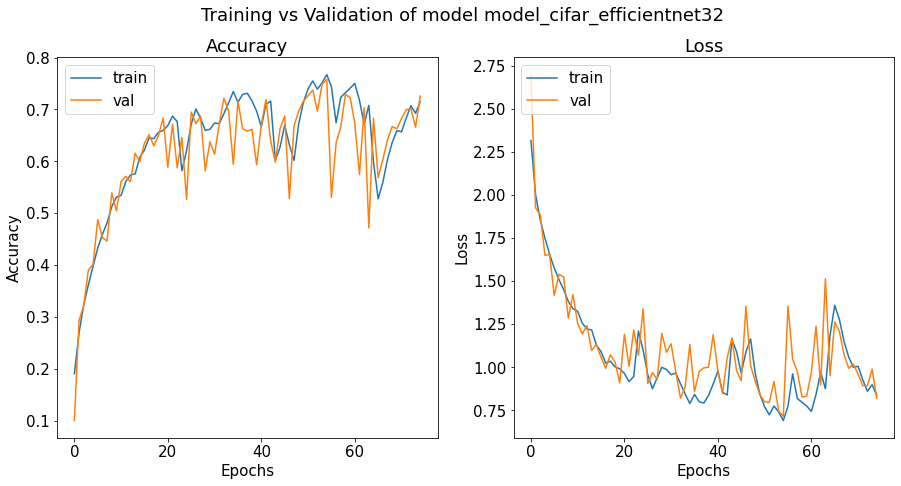

In [ ]:
# Efficientnet with TPU imgsize 32
plot_history(experiment_name)

In [ ]:
# load models and history for efficient net 224 x 224 image sizes
model_cifar_efficientnet = load_model('model_cifar_efficientnet')

models/model_cifar_efficientnet.pickle


In [ ]:
# Test accuracy
model_cifar_efficientnet.evaluate(testing_batches224)

1/1 [==============================] - 7s 7s/step - loss: 1.2076 - accuracy: 0.8400


[1.2075824737548828, 0.8399999737739563]

models/model_cifar_efficientnet.pickle


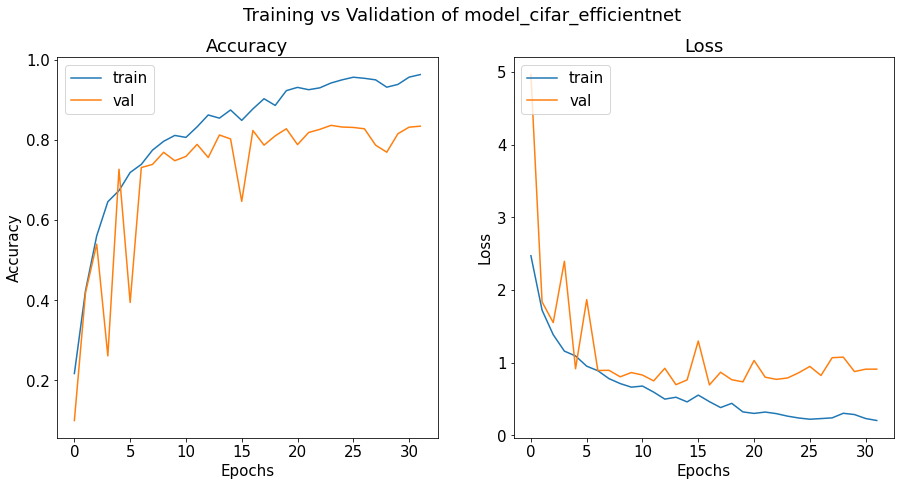

In [ ]:
plot_history(experiment_name)

####EfficientNet vs Resnet on Cifar-10

EfficientNetB10 has slightly better test accuracy and test loss compare to Resnet50_V2. EfficientNet also trained a bit faster than Resnet. However, the number of parameters of EfficientNet are much fewer than the number of parameters in Resnet.

In [ ]:
df = load_csv()
df_compare1 = df[df['model'].isin(['model_resnet_tpu', 'model_cifar_efficientnet'])]
df_compare1

,model,total_params,trainable_params,accuracy,val_accuracy,loss,val_loss,data,time,epoch,description,test_acc,test_loss
14,model_resnet_tpu,226777310,226731870,0.9746,0.8008,0.1060,0.9666,cifar,28.34,33,Resnet TPU no_aug imgsize_224,0.81,1.2002
16,model_cifar_efficientnet,131998081,131956058,0.9631,0.8343,0.2061,0.9125,cifar,22.70,32,Efficientnet TPU no_aug imgsize_224,0.84,1.2076


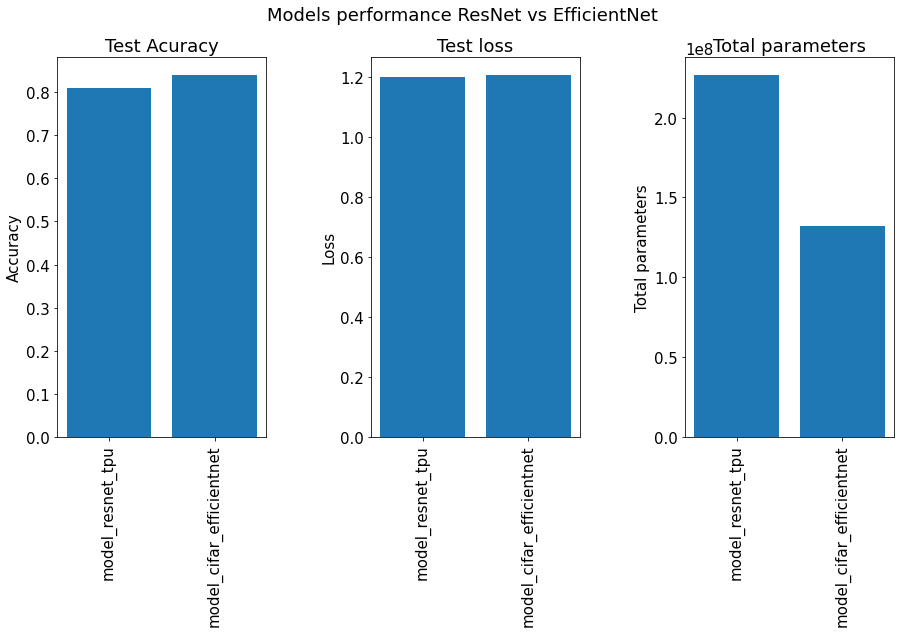

In [ ]:
fig = plt.figure(figsize=(15, 7))

fig.suptitle('Models performance ResNet vs EfficientNet')
fig.subplots_adjust(wspace=0.5)

ax1 = plt.subplot(1, 3, 1)
ax1.bar(df_compare1['model'],df_compare1['test_acc'])
ax1.set_ylabel('Accuracy')
ax1.set_title('Test Acuracy')
ax1.set_xticklabels(df_compare1['model'], rotation=90)

ax2 = plt.subplot(1, 3, 2)
ax2.bar(df_compare1['model'],df_compare1['test_loss'])
ax2.set_ylabel('Loss')
ax2.set_title('Test loss')
ax2.set_xticklabels(df_compare1['model'], rotation=90)

ax3 = plt.subplot(1, 3, 3)
ax3.bar(df_compare1['model'],df_compare1['total_params'])
ax3.set_ylabel('Total parameters')
ax3.set_title('Total parameters')
ax3.set_xticklabels(df_compare1['model'], rotation=90)


plt.show()

## Summary

**Conclusion from the experiments**
- MLP models, pre-trained models, ConvNet (with and without augmentation models) performed equally well on MNIST data
- EfficientNetB0 performed slightly better than ResNet50V2.
- EfficientNetB0 has much fewer total parameters than ResNet50V2.
- The higher image size, close to the recommended pre-trained models (224 x 224), performed better than the smaller size (32x32)
- Running the experiments on the TPU was much faster
- Augmented data does not always improve accuracy
- The higher the number of parameters, the longer the training time
- Using InverseTimeDecay makes models learn better and converge faster
- Lookahead optimiser produced better accuracy, but has not been proven to make the training faster.

**Challenges**
- GPU availbility: Google colab has limited GPU sharing power and limited RAM and may suddenly disconnect/reconnect during training, effectively invalidating experiments
- There are many factors in choosing the optimal learning rate and learning rate schedules. When you have to increase and decrease the learning rate during training runs. It needs many trials in stable environments in order to achieve a great result.
- Timing cannot be used for performance comparison. GPU avaibilty and memory affected each training run.

**What can be improved**
- Using Google AutoAugment to find the best augmentation strategy
- Integrating the tensorboard for training runs on the TPU
- Try Ranger optimiser (which is the combination of Rectified Adam and Lookahead optimiser)



##References

https://arxiv.org/pdf/1512.03385.pdf

https://arxiv.org/pdf/1907.08610.pdf

https://arxiv.org/pdf/1905.11946.pdf

https://www.quora.com/Why-do-the-state-of-the-art-deep-learning-models-like-ResNet-and-DenseNet-use-SGD-with-momentum-over-Adam-for-training

https://towardsdatascience.com/complete-architectural-details-of-all-efficientnet-models-5fd5b736142)

Lecture notes and practicals


**Save to html**
Run the following script in local jupyter. Note that the file name can not start with numeric

jupyter nbconvert --to html notebook.ipynb  
